In [10]:
import pandas as pd

First let us read the dataset to have a basic understanding

In [11]:
df = pd.read_csv('pokemon.csv')
df.head()

,abilities,against_bug,against_dark,against_dragon,against_electric,against_fairy,against_fight,against_fire,against_flying,against_ghost,...,percentage_male,pokedex_number,sp_attack,sp_defense,speed,type1,type2,weight_kg,generation,is_legendary
0,"['Overgrow', 'Chlorophyll']",1.0,1.0,1.0,0.5,0.5,0.5,2.0,2.0,1.0,...,88.1,1,65,65,45,grass,poison,6.9,1,0
1,"['Overgrow', 'Chlorophyll']",1.0,1.0,1.0,0.5,0.5,0.5,2.0,2.0,1.0,...,88.1,2,80,80,60,grass,poison,13.0,1,0
2,"['Overgrow', 'Chlorophyll']",1.0,1.0,1.0,0.5,0.5,0.5,2.0,2.0,1.0,...,88.1,3,122,120,80,grass,poison,100.0,1,0
3,"['Blaze', 'Solar Power']",0.5,1.0,1.0,1.0,0.5,1.0,0.5,1.0,1.0,...,88.1,4,60,50,65,fire,NaN,8.5,1,0
4,"['Blaze', 'Solar Power']",0.5,1.0,1.0,1.0,0.5,1.0,0.5,1.0,1.0,...,88.1,5,80,65,80,fire,NaN,19.0,1,0


Let us look at all the columns in the dataset

In [12]:
df.columns

Index(['abilities', 'against_bug', 'against_dark', 'against_dragon',
       'against_electric', 'against_fairy', 'against_fight', 'against_fire',
       'against_flying', 'against_ghost', 'against_grass', 'against_ground',
       'against_ice', 'against_normal', 'against_poison', 'against_psychic',
       'against_rock', 'against_steel', 'against_water', 'attack',
       'base_egg_steps', 'base_happiness', 'base_total', 'capture_rate',
       'classfication', 'defense', 'experience_growth', 'height_m', 'hp',
       'japanese_name', 'name', 'percentage_male', 'pokedex_number',
       'sp_attack', 'sp_defense', 'speed', 'type1', 'type2', 'weight_kg',
       'generation', 'is_legendary'],
      dtype='object')

Now let us analyse the data types of the columns so that we can convert the non numerical values into numerical values for further analysis

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 801 entries, 0 to 800
Data columns (total 41 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   abilities          801 non-null    object 
 1   against_bug        801 non-null    float64
 2   against_dark       801 non-null    float64
 3   against_dragon     801 non-null    float64
 4   against_electric   801 non-null    float64
 5   against_fairy      801 non-null    float64
 6   against_fight      801 non-null    float64
 7   against_fire       801 non-null    float64
 8   against_flying     801 non-null    float64
 9   against_ghost      801 non-null    float64
 10  against_grass      801 non-null    float64
 11  against_ground     801 non-null    float64
 12  against_ice        801 non-null    float64
 13  against_normal     801 non-null    float64
 14  against_poison     801 non-null    float64
 15  against_psychic    801 non-null    float64
 16  against_rock       801 non

Check for null values in each column

In [14]:
df.isnull().sum()


abilities              0
against_bug            0
against_dark           0
against_dragon         0
against_electric       0
against_fairy          0
against_fight          0
against_fire           0
against_flying         0
against_ghost          0
against_grass          0
against_ground         0
against_ice            0
against_normal         0
against_poison         0
against_psychic        0
against_rock           0
against_steel          0
against_water          0
attack                 0
base_egg_steps         0
base_happiness         0
base_total             0
capture_rate           0
classfication          0
defense                0
experience_growth      0
height_m              20
hp                     0
japanese_name          0
name                   0
percentage_male       98
pokedex_number         0
sp_attack              0
sp_defense             0
speed                  0
type1                  0
type2                384
weight_kg             20
generation             0


In [15]:
df.shape

(801, 41)

Calculate the most repeated values for each column i.e calculate the mode

In [16]:
most_frequent_values = df.mode().iloc[0]
print(most_frequent_values)

abilities              ['Levitate']
against_bug                     1.0
against_dark                    1.0
against_dragon                  1.0
against_electric                1.0
against_fairy                   1.0
against_fight                   1.0
against_fire                    1.0
against_flying                  1.0
against_ghost                   1.0
against_grass                   1.0
against_ground                  1.0
against_ice                     1.0
against_normal                  1.0
against_poison                  1.0
against_psychic                 1.0
against_rock                    1.0
against_steel                   1.0
against_water                   1.0
attack                        100.0
base_egg_steps               5120.0
base_happiness                 70.0
base_total                    405.0
capture_rate                     45
classfication        Dragon Pokémon
defense                        50.0
experience_growth         1000000.0
height_m                    

Replace the null values with most repeated values in each column

In [17]:
df.fillna(most_frequent_values, inplace=True)
df.isnull().sum()

abilities            0
against_bug          0
against_dark         0
against_dragon       0
against_electric     0
against_fairy        0
against_fight        0
against_fire         0
against_flying       0
against_ghost        0
against_grass        0
against_ground       0
against_ice          0
against_normal       0
against_poison       0
against_psychic      0
against_rock         0
against_steel        0
against_water        0
attack               0
base_egg_steps       0
base_happiness       0
base_total           0
capture_rate         0
classfication        0
defense              0
experience_growth    0
height_m             0
hp                   0
japanese_name        0
name                 0
percentage_male      0
pokedex_number       0
sp_attack            0
sp_defense           0
speed                0
type1                0
type2                0
weight_kg            0
generation           0
is_legendary         0
dtype: int64

The capture_rate column has a different value called '30 (Meteorite)255 (Core)' . We need to handle it and the numerical values are in string format , we need to convert them also

In [18]:
print(df['capture_rate'].unique())

['45' '255' '120' '127' '90' '190' '75' '235' '150' '25' '170' '50' '200'
 '100' '180' '60' '225' '30' '35' '3' '65' '70' '125' '205' '155' '145'
 '130' '140' '15' '220' '160' '80' '55' '30 (Meteorite)255 (Core)']


Classification column have too many categories when compared to the dataset. This column can never be helpful in any analysis as the categorical values are not related to each other in any way

In [19]:
print(df['classfication'].unique())

['Seed Pokémon' 'Lizard Pokémon' 'Flame Pokémon' 'Tiny Turtle Pokémon'
 'Turtle Pokémon' 'Shellfish Pokémon' 'Worm Pokémon' 'Cocoon Pokémon'
 'Butterfly Pokémon' 'Hairy Pokémon' 'Poison Bee Pokémon'
 'Tiny Bird Pokémon' 'Bird Pokémon' 'Mouse Pokémon' 'Beak Pokémon'
 'Snake Pokémon' 'Cobra Pokémon' 'Poison Pin Pokémon' 'Drill Pokémon'
 'Fairy Pokémon' 'Fox Pokémon' 'Balloon Pokémon' 'Bat Pokémon'
 'Weed Pokémon' 'Flower Pokémon' 'Mushroom Pokémon' 'Insect Pokémon'
 'Poison Moth Pokémon' 'Mole Pokémon' 'Scratch Cat Pokémon'
 'Classy Cat Pokémon' 'Duck Pokémon' 'Pig Monkey Pokémon' 'Puppy Pokémon'
 'Legendary Pokémon' 'Tadpole Pokémon' 'Psi Pokémon' 'Superpower Pokémon'
 'Flycatcher Pokémon' 'Jellyfish Pokémon' 'Rock Pokémon' 'Megaton Pokémon'
 'Fire Horse Pokémon' 'Dopey Pokémon' 'Hermit Crab Pokémon'
 'Magnet Pokémon' 'Wild Duck Pokémon' 'Twin Bird Pokémon'
 'Triple Bird Pokémon' 'Sea Lion Pokémon' 'Sludge Pokémon'
 'Bivalve Pokémon' 'Gas Pokémon' 'Shadow Pokémon' 'Rock Snake Pokémon'
 

The columns type1 and type2 are helpful as they are useful to classify the pokemons under few conditions unlike the classification column

In [20]:
print(df['type1'].unique())


['grass' 'fire' 'water' 'bug' 'normal' 'poison' 'electric' 'ground'
 'fairy' 'fighting' 'psychic' 'rock' 'ghost' 'ice' 'dragon' 'dark' 'steel'
 'flying']


In [21]:
print(df['type2'].unique())

['poison' 'flying' 'dark' 'electric' 'ice' 'ground' 'fairy' 'grass'
 'fighting' 'psychic' 'steel' 'fire' 'rock' 'water' 'dragon' 'ghost' 'bug'
 'normal']


Now we are removing columns that are not useful for our analysis such as 'japanese_name','name','abilities' . We still have 'pokedox_number' to uniquely identify each pokemon if required

In [22]:
# Assuming the columns are named exactly 'japanese_name' 'name' and 'abilities'
columns_to_remove = ['japanese_name','name','abilities']

# Remove the specified columns
df = df.drop(columns_to_remove, axis=1)

print(df.head()) # Optional: Display the first few rows to verify changes

   against_bug  against_dark  against_dragon  against_electric  against_fairy  \
0          1.0           1.0             1.0               0.5            0.5   
1          1.0           1.0             1.0               0.5            0.5   
2          1.0           1.0             1.0               0.5            0.5   
3          0.5           1.0             1.0               1.0            0.5   
4          0.5           1.0             1.0               1.0            0.5   

   against_fight  against_fire  against_flying  against_ghost  against_grass  \
0            0.5           2.0             2.0            1.0           0.25   
1            0.5           2.0             2.0            1.0           0.25   
2            0.5           2.0             2.0            1.0           0.25   
3            1.0           0.5             1.0            1.0           0.50   
4            1.0           0.5             1.0            1.0           0.50   

   ...  percentage_male  pokedex

Pokedox number acts as a index

In [23]:
print(df['pokedex_number'].unique())


[  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198
 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216
 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234
 235 236 237 238 239 240 241 242 243 244 245 246 24

In [24]:
df.columns

Index(['against_bug', 'against_dark', 'against_dragon', 'against_electric',
       'against_fairy', 'against_fight', 'against_fire', 'against_flying',
       'against_ghost', 'against_grass', 'against_ground', 'against_ice',
       'against_normal', 'against_poison', 'against_psychic', 'against_rock',
       'against_steel', 'against_water', 'attack', 'base_egg_steps',
       'base_happiness', 'base_total', 'capture_rate', 'classfication',
       'defense', 'experience_growth', 'height_m', 'hp', 'percentage_male',
       'pokedex_number', 'sp_attack', 'sp_defense', 'speed', 'type1', 'type2',
       'weight_kg', 'generation', 'is_legendary'],
      dtype='object')

In [25]:
!pip install category_encoders
import category_encoders as ce

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 2.0 MB/s eta 0:00:00


In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

Repacing 30 (Meteorite)255 (Core) with 45 as it is the mode of the column

In [27]:
# Assuming 'capture_rate' is the name of the column containing capture rates
print(df['capture_rate'].value_counts())


capture_rate
45                          250
190                          75
255                          69
75                           61
3                            58
120                          55
60                           50
90                           38
30                           20
200                          19
225                          15
25                           13
180                          11
50                            7
150                           7
235                           7
100                           6
140                           6
127                           5
70                            4
65                            3
125                           3
55                            3
170                           2
130                           2
15                            2
220                           2
80                            2
205                           1
155                           1
145                        

In [28]:
df['capture_rate'] = df['capture_rate'].replace('30 (Meteorite)255 (Core)', '45')

In [29]:
df['capture_rate'] = df['capture_rate'].astype(int)

In [30]:
from sklearn.preprocessing import LabelEncoder


Transforming the columns using  LabelEncoder so that when they become numerical values we can apply other operations along with other columns in the dataset

In [31]:
label_encoder = LabelEncoder()

# Fit and transform each column separately
df['type1_en'] = label_encoder.fit_transform(df['type1'])
df['type2_en'] = label_encoder.fit_transform(df['type2'])
df['classfication_en'] = label_encoder.fit_transform(df['classfication'])

In [32]:
df['type1_en'] = df['type1_en'].astype(int)
df['type2_en'] = df['type2_en'].astype(int)
df['classfication_en'] = df['classfication_en'].astype(int)

In [33]:
# Drop the original columns
df = df.drop(['type1', 'type2', 'classfication'], axis=1)

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 801 entries, 0 to 800
Data columns (total 38 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   against_bug        801 non-null    float64
 1   against_dark       801 non-null    float64
 2   against_dragon     801 non-null    float64
 3   against_electric   801 non-null    float64
 4   against_fairy      801 non-null    float64
 5   against_fight      801 non-null    float64
 6   against_fire       801 non-null    float64
 7   against_flying     801 non-null    float64
 8   against_ghost      801 non-null    float64
 9   against_grass      801 non-null    float64
 10  against_ground     801 non-null    float64
 11  against_ice        801 non-null    float64
 12  against_normal     801 non-null    float64
 13  against_poison     801 non-null    float64
 14  against_psychic    801 non-null    float64
 15  against_rock       801 non-null    float64
 16  against_steel      801 non

Finding if any two columns are correlated using the corrrelation matrix

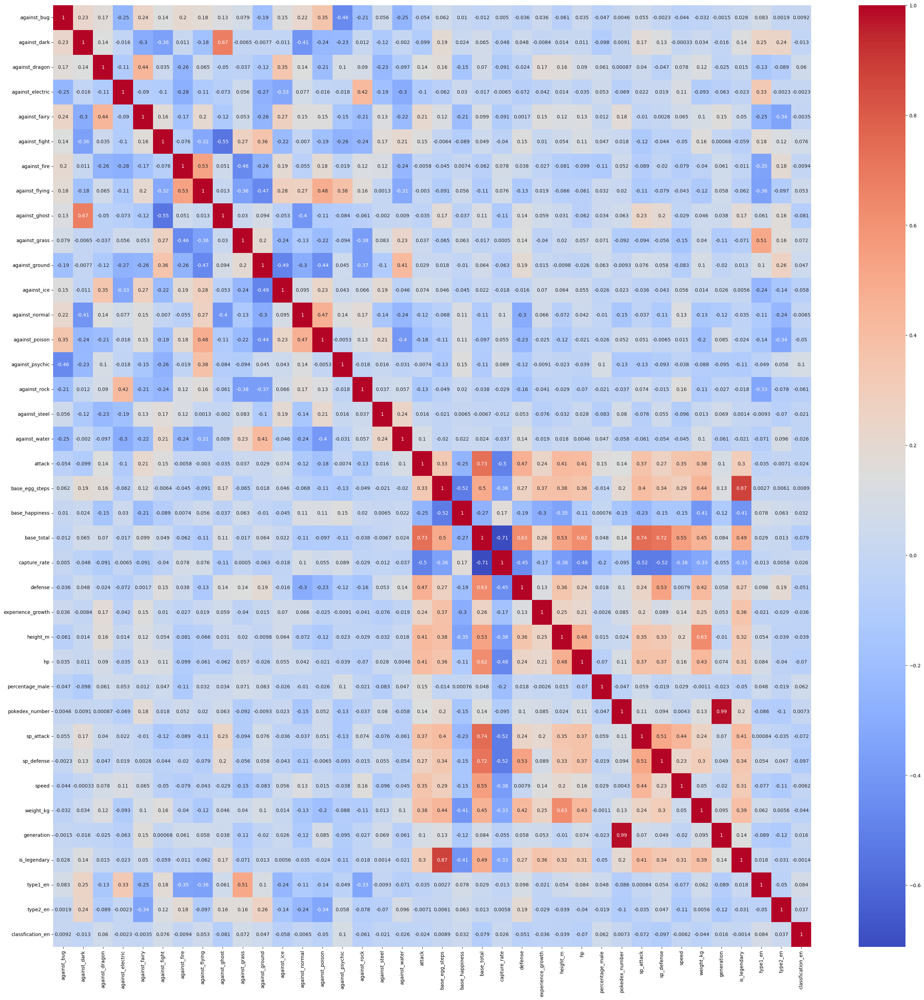

In [35]:
# Calculate the correlation matrix
corr_matrix = df.corr()

# Visualize the correlation matrix
plt.figure(figsize=(35,35))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()

As new generation pokemons are added later so they have high pokedox_number and we can note a signnificant relation between two columns that are base_egg_steps and is_legendary . This is  a interesting finding which says that the base_egg_steps ar edirectly correlated to the pokemon being  is_legendary

In [36]:
# Find pairs of highly correlated features
threshold = 0.8
high_corr_pairs = []

for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > threshold:
            colname1 = corr_matrix.columns[i]
            colname2 = corr_matrix.columns[j]
            high_corr_pairs.append((colname1, colname2, corr_matrix.iloc[i, j]))

# Print the pairs of highly correlated features
for pair in high_corr_pairs:
    print(pair)


('generation', 'pokedex_number', 0.9859041338189449)
('is_legendary', 'base_egg_steps', 0.8734883403994574)


From the plot, it appears that there is a pattern where legendary Pokémon generally require more steps to hatch compared to non-legendary Pokémon. Specifically:

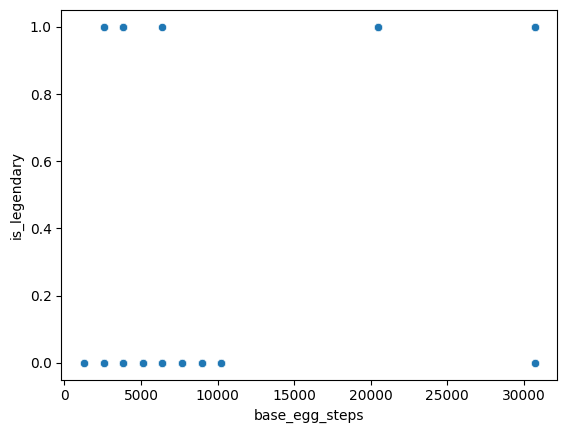

In [37]:
#draw correlation graph between base_egg_steps and is_legendary

sns.scatterplot(data=df, x="base_egg_steps", y="is_legendary")
plt.show()


In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 801 entries, 0 to 800
Data columns (total 38 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   against_bug        801 non-null    float64
 1   against_dark       801 non-null    float64
 2   against_dragon     801 non-null    float64
 3   against_electric   801 non-null    float64
 4   against_fairy      801 non-null    float64
 5   against_fight      801 non-null    float64
 6   against_fire       801 non-null    float64
 7   against_flying     801 non-null    float64
 8   against_ghost      801 non-null    float64
 9   against_grass      801 non-null    float64
 10  against_ground     801 non-null    float64
 11  against_ice        801 non-null    float64
 12  against_normal     801 non-null    float64
 13  against_poison     801 non-null    float64
 14  against_psychic    801 non-null    float64
 15  against_rock       801 non-null    float64
 16  against_steel      801 non

Dropping the unnecessary column classification_en as it have so many values for classfication and this many values are not helpful for our analysis

In [39]:
df = df.drop(columns=['classfication_en'])

Normalising the columns such that the values lie withinn a certain range and it will be helpful for us to compare different columns irrespective of their units. Now we dont normalise value such as type1_en , type2_en , is_legendary ,generation and pokedox_number as they are used to classify the pokemons and dont possess any units

RobustScaler is used to handle the outliers as we cant remove them in order to consider all possible things in the pokemon world

In [40]:
from sklearn.preprocessing import RobustScaler
features_to_normalize = ['hp', 'attack', 'defense', 'sp_attack', 'sp_defense', 'speed','base_happiness', 'base_total','base_egg_steps','capture_rate','experience_growth', 'height_m','weight_kg']

# Apply RobustScaler
robust_scaler = RobustScaler()
df = df.copy()
df[features_to_normalize] = robust_scaler.fit_transform(df[features_to_normalize])

print("Robust Scaled DataFrame:")
print(df)

Robust Scaled DataFrame:
     against_bug  against_dark  against_dragon  against_electric  \
0           1.00           1.0             1.0               0.5   
1           1.00           1.0             1.0               0.5   
2           1.00           1.0             1.0               0.5   
3           0.50           1.0             1.0               1.0   
4           0.50           1.0             1.0               1.0   
..           ...           ...             ...               ...   
796         0.25           1.0             0.5               2.0   
797         1.00           1.0             0.5               0.5   
798         2.00           0.5             2.0               0.5   
799         2.00           2.0             1.0               1.0   
800         0.25           0.5             0.0               1.0   

     against_fairy  against_fight  against_fire  against_flying  \
0              0.5            0.5           2.0             2.0   
1              0.5      

As we can see the dataset is highly imbalanced. We need to perform re sampling techniques later before preparing our model

In [41]:
print(df['is_legendary'].value_counts())

is_legendary
0    731
1     70
Name: count, dtype: int64


Now let us see various graphs and make points whenever we make a new finding

Let us first consider the columns 'hp', 'attack', 'defense', 'sp_attack', 'sp_defense' and 'speed'

The distributions are mostly right-skewed which indicate that most of the values are low valued and less than the average value. Then there are also few values above the average.

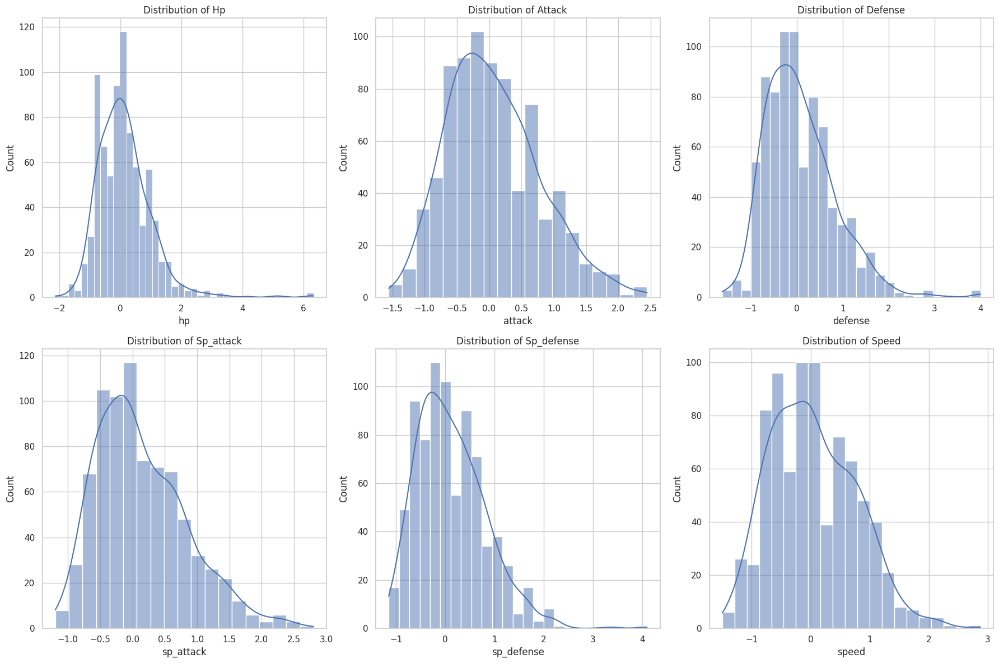

In [42]:
# Set plot style
sns.set(style="whitegrid")

# 1. Visualize distributions of key attributes
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
attributes = ['hp', 'attack', 'defense', 'sp_attack', 'sp_defense', 'speed']

for i, attr in enumerate(attributes):
    sns.histplot(df[attr], kde=True, ax=axes[i // 3, i % 3])
    axes[i // 3, i % 3].set_title(f'Distribution of {attr.capitalize()}')

plt.tight_layout()
plt.show()

Now let us see the boxplot for the above columns to find the outliers and see the distribution of the values accross various generations and is_legendary

HP by Generation and Legendary Status

Generally, legendary Pokémon (orange) have higher HP compared to non-legendary Pokémon (blue).
The median HP for legendary Pokémon is consistently higher across generations.
There are more outliers in the HP values for non-legendary Pokémon across generations.

Attack by Generation and Legendary Status

Legendary Pokémon tend to have higher attack values than non-legendary Pokémon.
The difference in attack values between legendary and non-legendary Pokémon is notable in most generations.
Variability in attack values is higher for non-legendary Pokémon.

Defense by Generation and Legendary Status

Legendary Pokémon generally have higher defense values compared to non-legendary Pokémon.
The median defense value for legendary Pokémon is consistently higher across generations.
The interquartile range for defense values in non-legendary Pokémon shows more variation.

Special Attack (Sp_attack) by Generation and Legendary Status

Legendary Pokémon tend to have higher special attack values compared to non-legendary Pokémon.
The difference in special attack values is more pronounced in certain generations (e.g., generation 4 and 5).
Non-legendary Pokémon show more variability in their special attack values.

Special Defense (Sp_defense) by Generation and Legendary Status

Legendary Pokémon generally have higher special defense values compared to non-legendary Pokémon.
The median special defense value for legendary Pokémon is consistently higher across generations.
Non-legendary Pokémon have more outliers in their special defense values.

Speed by Generation and Legendary Status

Legendary Pokémon tend to have higher speed values compared to non-legendary Pokémon.
The difference in speed values is notable in several generations.
There is a higher variability in speed values among non-legendary Pokémon.

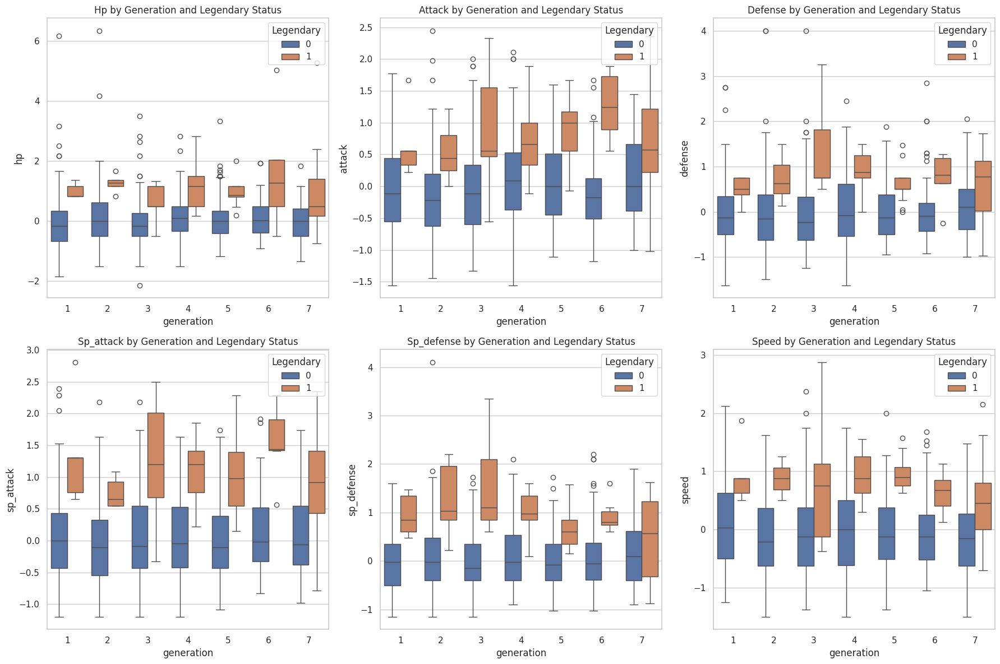

In [43]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
for i, attr in enumerate(attributes):
    sns.boxplot(data=df, x='generation', y=attr, hue='is_legendary', ax=axes[i // 3, i % 3])
    axes[i // 3, i % 3].set_title(f'{attr.capitalize()} by Generation and Legendary Status')
    axes[i // 3, i % 3].legend(title='Legendary', loc='upper right')

plt.tight_layout()
plt.show()

Now let us analyse the attacks taken by the various pokemons against various styles of pokemons

These plots dont help much as the values are not continuous . We can only understand what values are present and where the maximum number of values reside

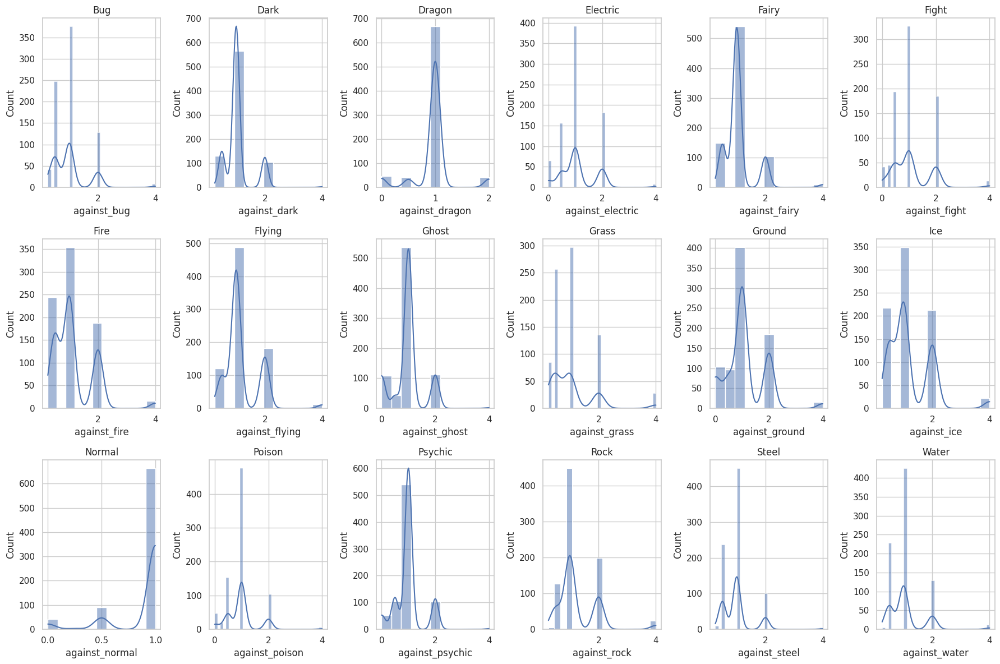

In [44]:
type_effectiveness = [col for col in df.columns if col.startswith('against_')]
fig, axes = plt.subplots(3, 6, figsize=(18, 12))

for i, col in enumerate(type_effectiveness):
    sns.histplot(df[col], kde=True, ax=axes[i // 6, i % 6])
    axes[i // 6, i % 6].set_title(col.replace('against_', '').capitalize())

plt.tight_layout()
plt.show()

Now let us see the boxplot for the above columns to find the outliers and see the distribution of the values accross various generations and is_legendary

Analysis against the generations:

'against_bug', : equally distributed across the generations
'against_dark' : generations 6 and  7 dominate
'against_dragon' : more ouliers cant specify anything
'against_electric' : generations 1 and  2 dominate
'against_fairy' : generation 1 dominates
'against_fight' : 3 4 5 dominates
'against_fire' : 2 6 7  dominates
'against_flying' : 4 7 dominates
'against_ghost' : more outliers cant specify anything
'against_grass' : 1 dominates
'against_ground' : 1 4 6 dominates
'against_ice' : 3 4 less dominant
'against_normal' : more outliers cant specify anything
'against_poison' : more outliers cant specify anything
'against_psychic' :1 generation dominates
'against_rock' : 3 4 less dominant
'against_steel' : qually distributed across the generations
'against_water' : 2 less dominant

Analysis against the is_legendary:

'against_bug', : equally distributed between legendary and non legendary
'against_dark' : legendary dominates
'against_dragon' : equally distributed between legendary and non legendary
'against_electric' : equally distributed between legendary and non legendary
'against_fairy' : equally distributed between legendary and non legendary
'against_fight' : non-legendary dominates
'against_fire' : non-legendary dominates
'against_flying' : non-legendary dominates
'against_ghost' : legendary dominates
'against_grass' : equally distributed between legendary and non legendary
'against_ground' : legendary dominates
'against_ice' : non-legendary dominates
'against_normal' : equally distributed between legendary and non legendary
'against_poison' : equally distributed between legendary and non legendary
'against_psychic' :legendary dominates
'against_rock' :non-legendary dominates
'against_steel' : equally distributed between legendary and non legendary
'against_water' : equally distributed between legendary and non legendary

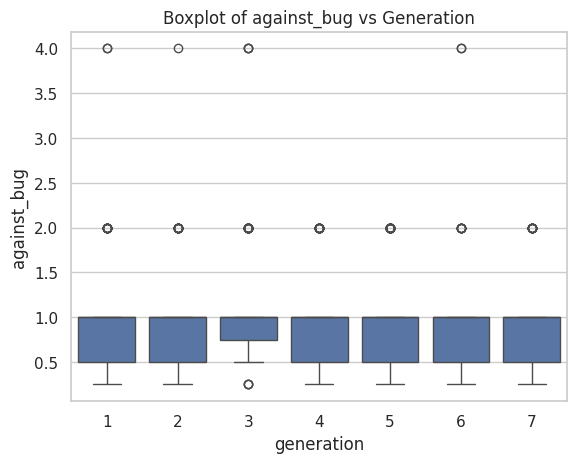

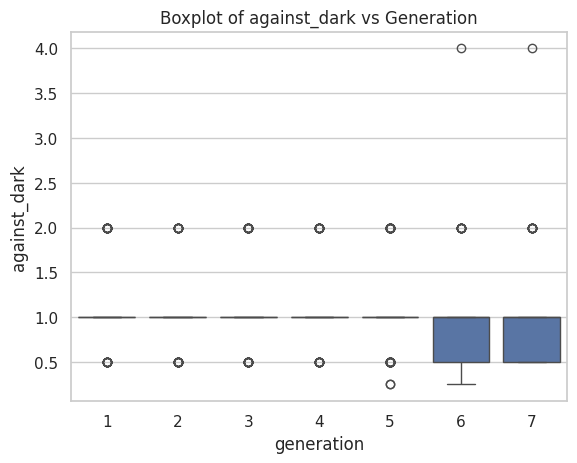

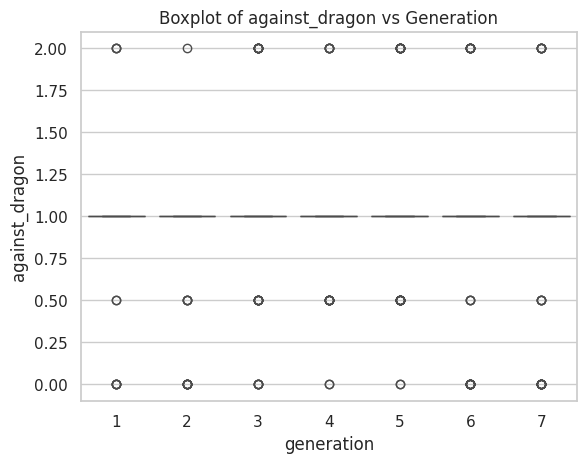

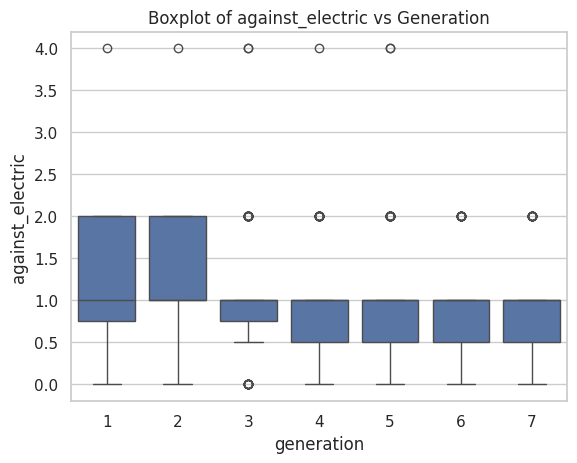

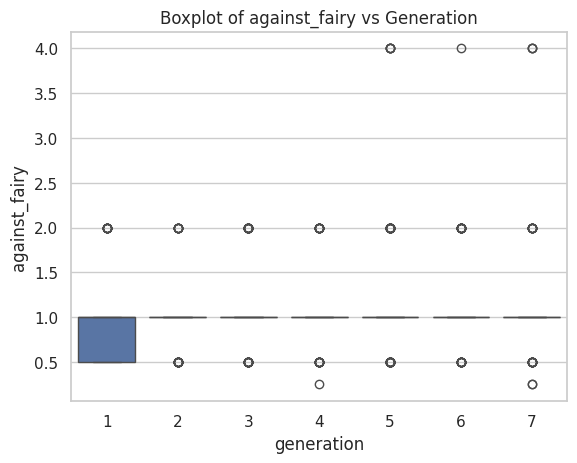

...

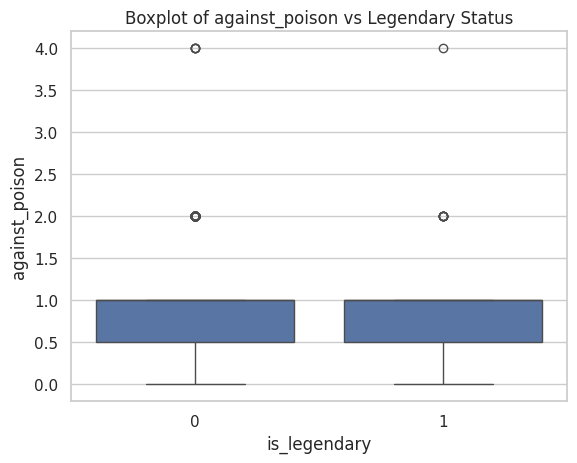

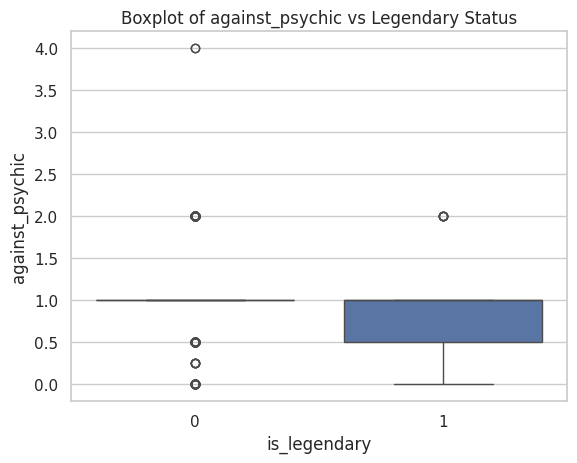

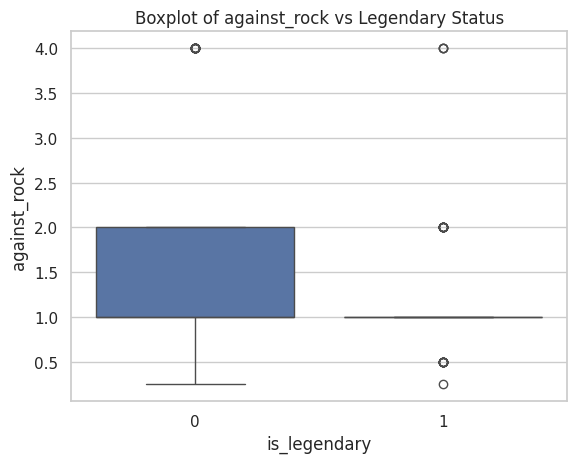

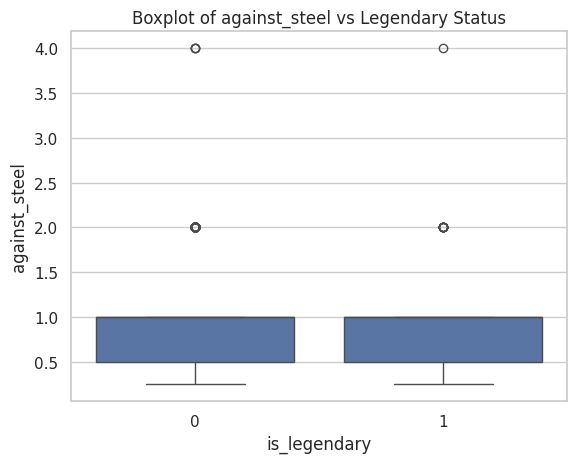

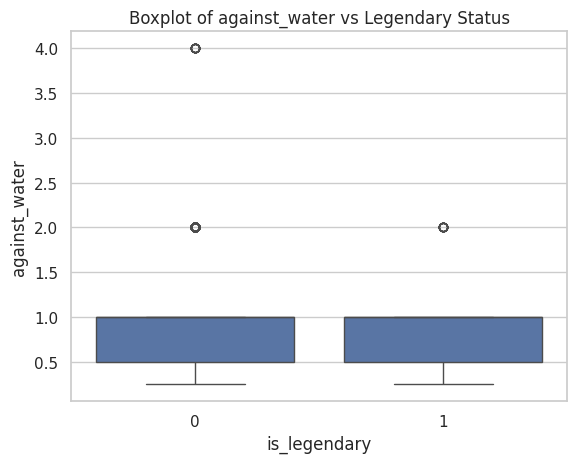

In [45]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame
type_effectiveness = [col for col in df.columns if col.startswith('against_')]

# Create boxplots for each 'against_' column with respect to 'generation'
for col in type_effectiveness:
    plt.figure()  # Create a new figure for each plot
    sns.boxplot(x='generation', y=col, data=df)
    plt.title(f"Boxplot of {col} vs Generation")
    plt.show()

# Create boxplots for each 'against_' column with respect to 'is_legendary'
for col in type_effectiveness:
    plt.figure()
    sns.boxplot(x='is_legendary', y=col, data=df)
    plt.title(f"Boxplot of {col} vs Legendary Status")
    plt.show()

Now let us see the scatterplot for the above columns to find the outliers and see the distribution of the values accross various generations and is_legendary

compared with is_legendary
Generations dont have much affects
All legendary clearly dominate in all fields

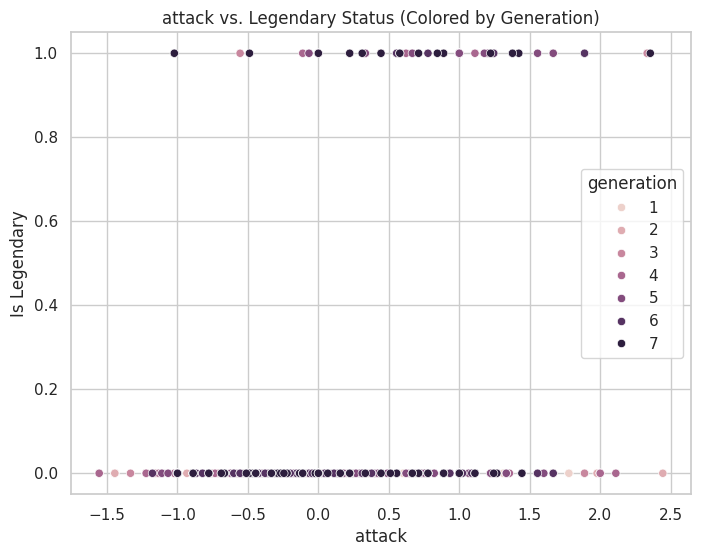

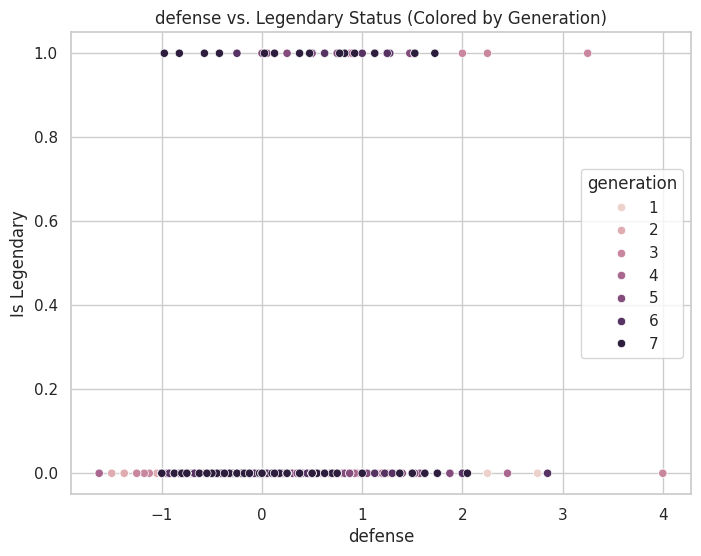

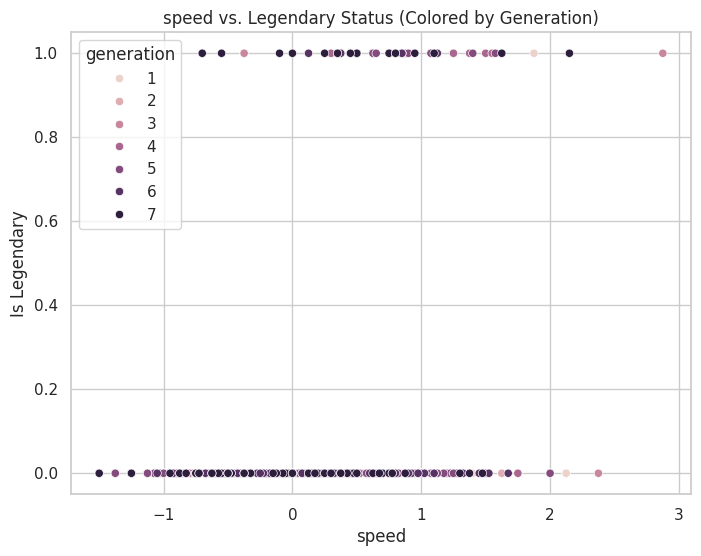

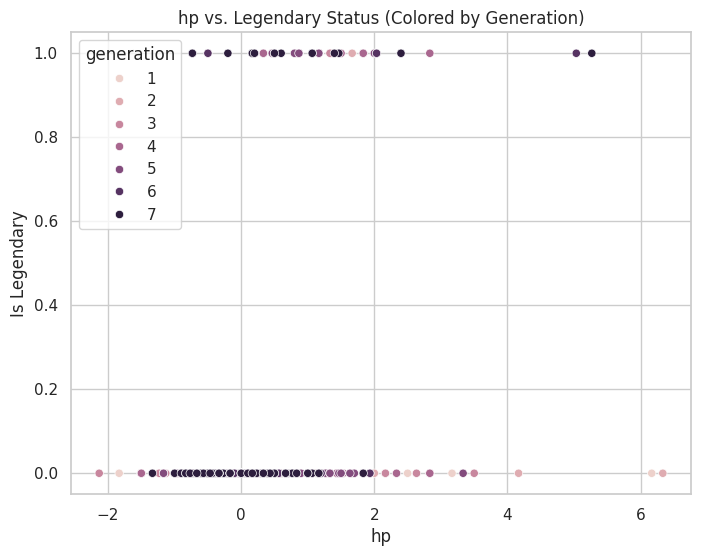

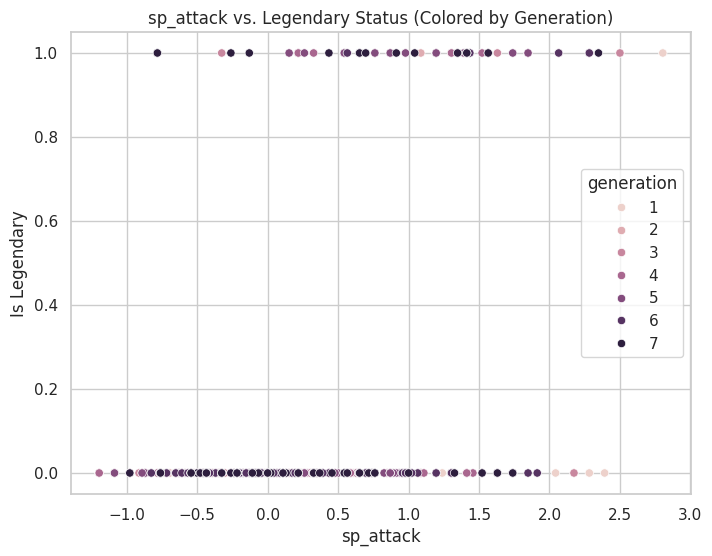

...

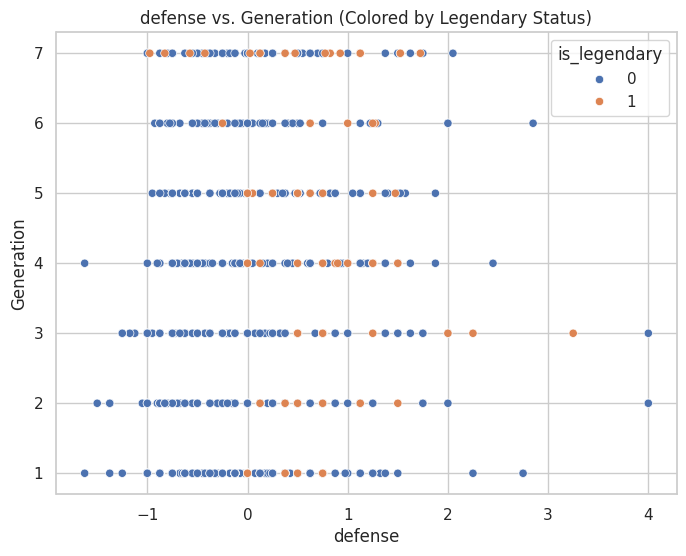

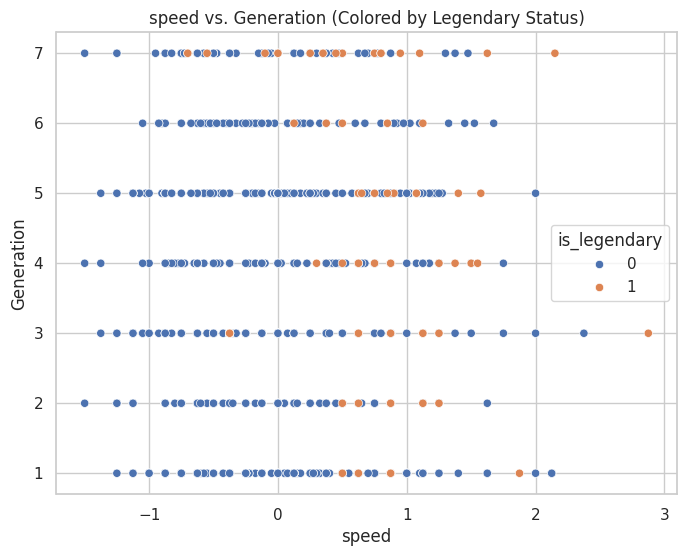

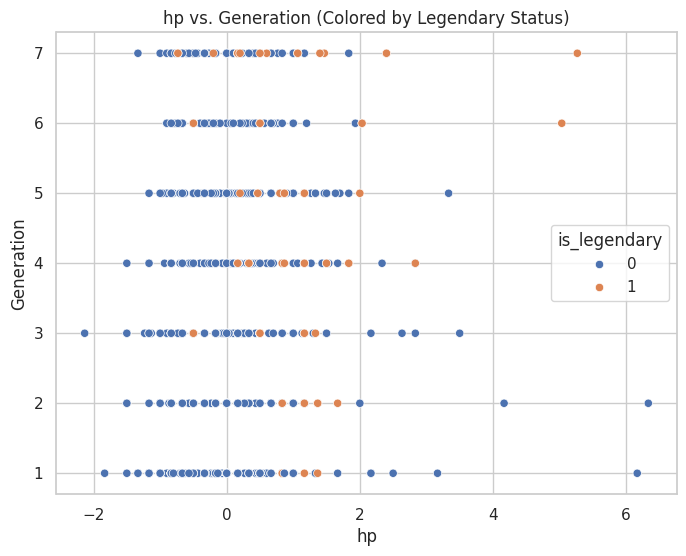

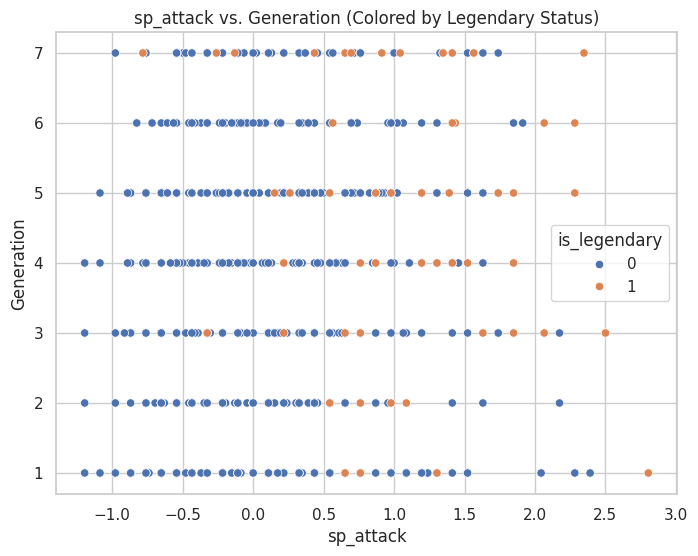

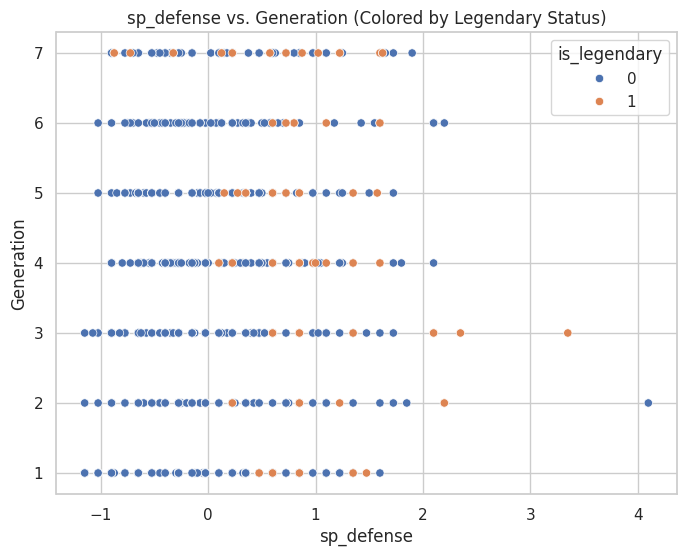

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is your DataFrame and it contains columns like
# 'is_legendary', 'generation', 'attack', 'defense', 'speed', etc.

features = ['attack', 'defense', 'speed', 'hp', 'sp_attack', 'sp_defense']

# Scatter plots for features against 'is_legendary'
for feature in features:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=feature, y='is_legendary', data=df, hue='generation')
    plt.title(f'{feature} vs. Legendary Status (Colored by Generation)')
    plt.xlabel(feature)
    plt.ylabel('Is Legendary')
    plt.show()

# Scatter plots for features against 'generation'
for feature in features:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=feature, y='generation', data=df, hue='is_legendary')
    plt.title(f'{feature} vs. Generation (Colored by Legendary Status)')
    plt.xlabel(feature)
    plt.ylabel('Generation')
    plt.show()

Cannot infer much from the below analysis as they are not continuous values

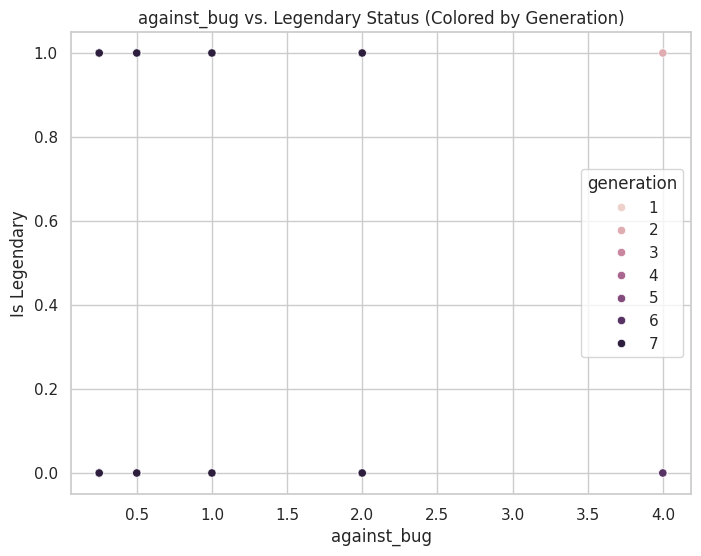

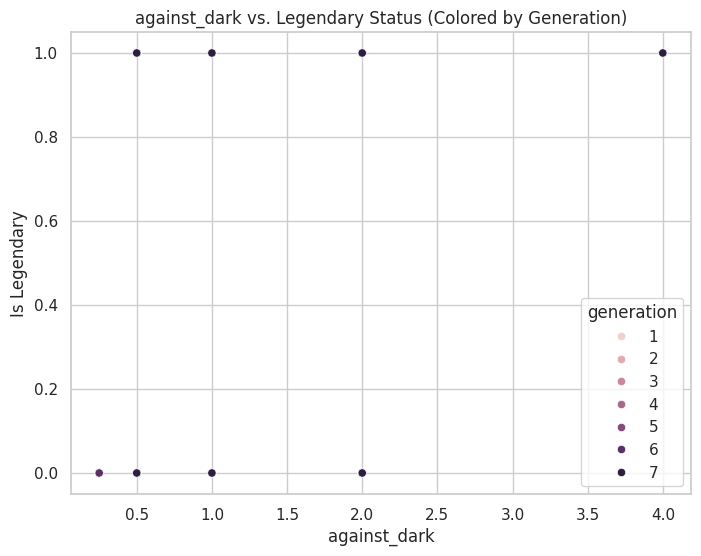

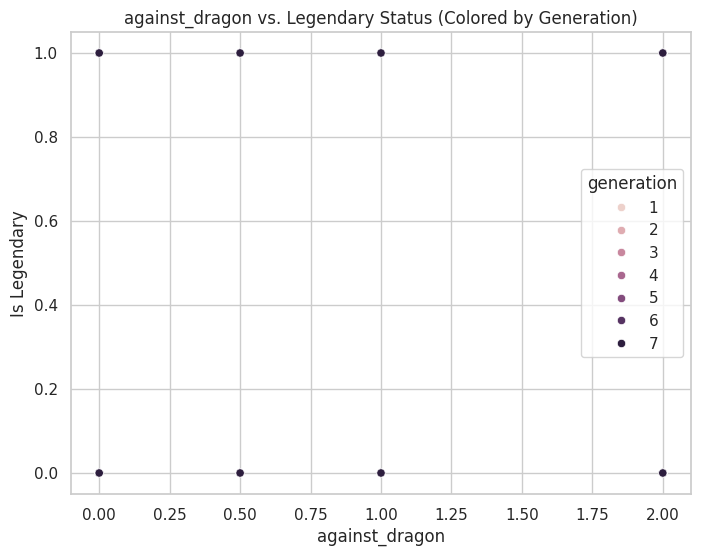

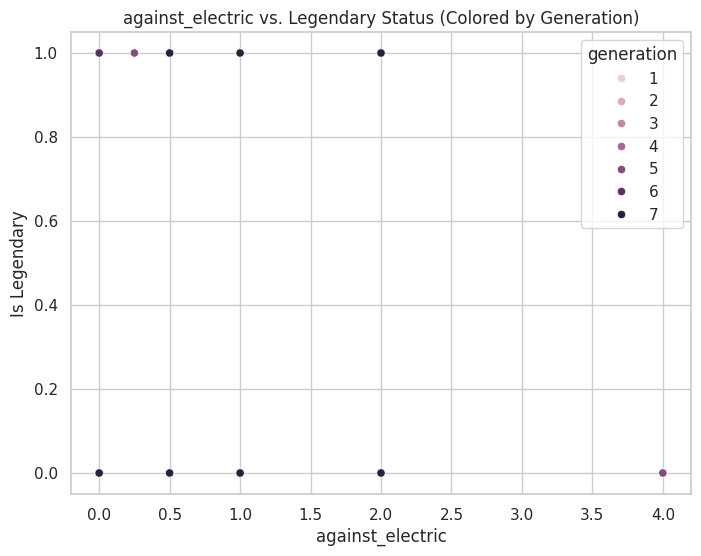

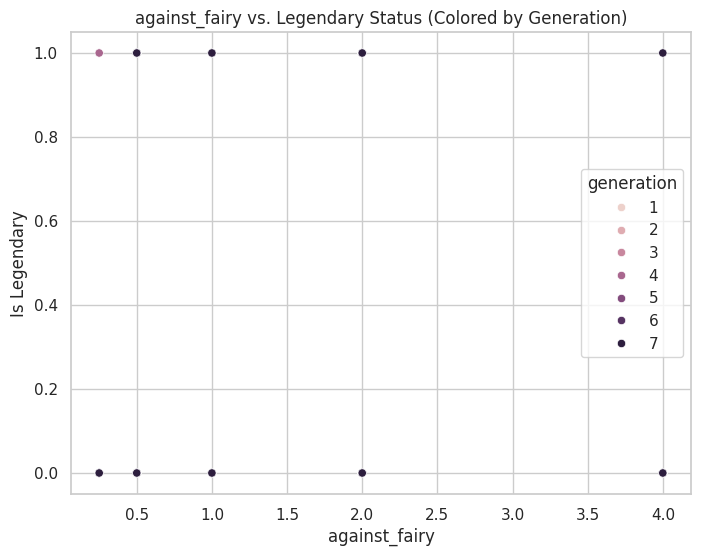

...

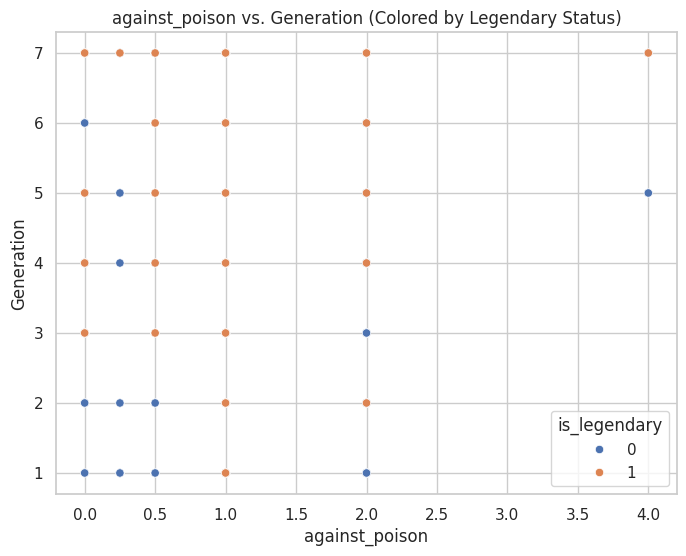

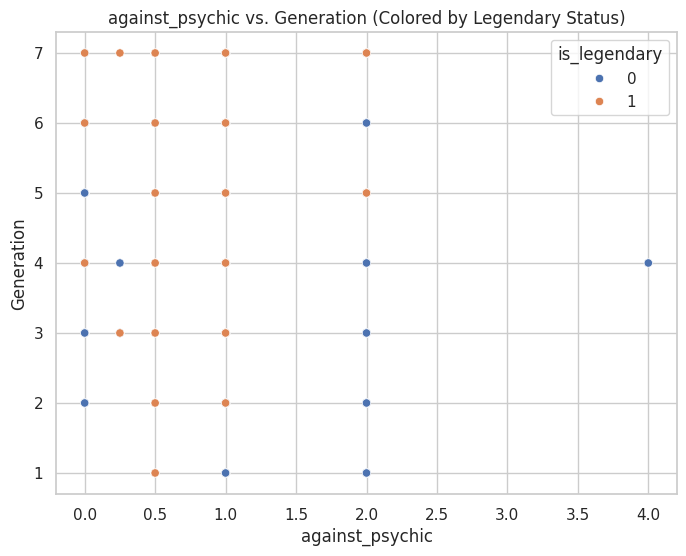

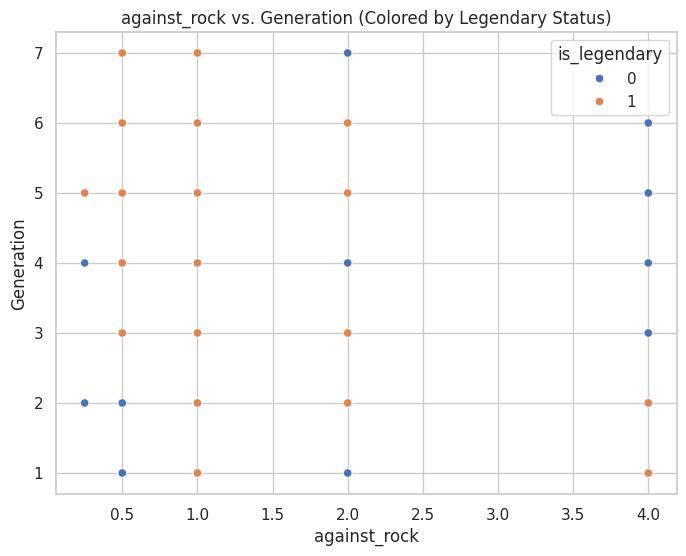

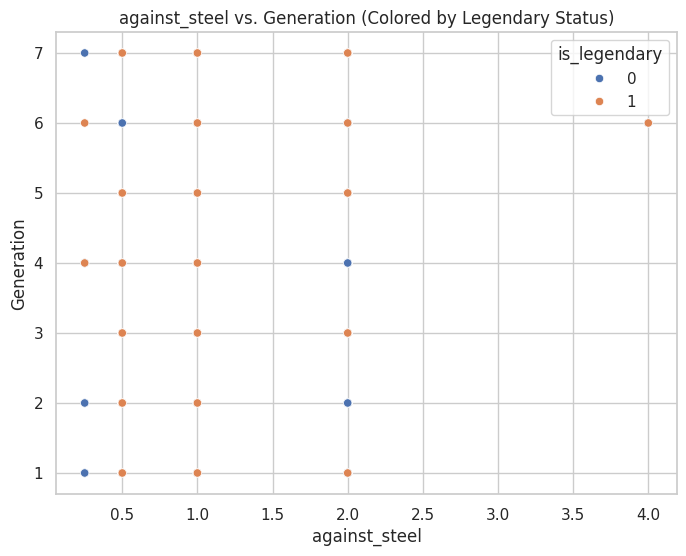

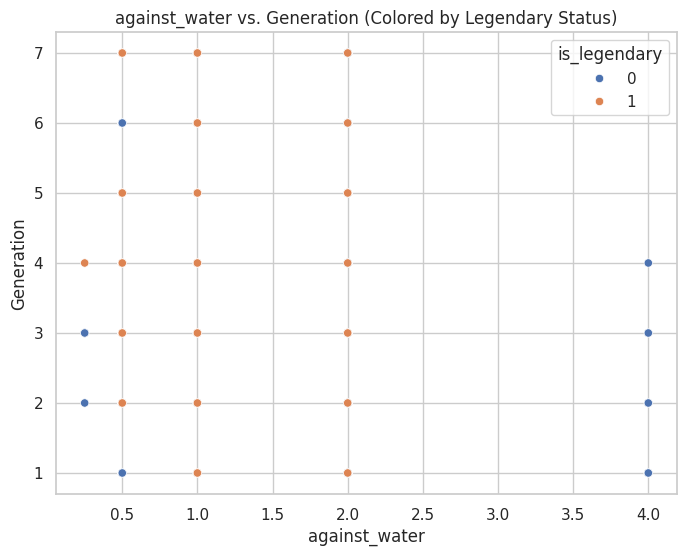

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is your DataFrame and it contains columns like
# 'is_legendary', 'generation', 'attack', 'defense', 'speed', etc.

features = ['against_bug', 'against_dark', 'against_dragon',
       'against_electric', 'against_fairy', 'against_fight', 'against_fire',
       'against_flying', 'against_ghost', 'against_grass', 'against_ground',
       'against_ice', 'against_normal', 'against_poison', 'against_psychic',
       'against_rock', 'against_steel', 'against_water']

# Scatter plots for features against 'is_legendary'
for feature in features:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=feature, y='is_legendary', data=df, hue='generation')
    plt.title(f'{feature} vs. Legendary Status (Colored by Generation)')
    plt.xlabel(feature)
    plt.ylabel('Is Legendary')
    plt.show()

# Scatter plots for features against 'generation'
for feature in features:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=feature, y='generation', data=df, hue='is_legendary')
    plt.title(f'{feature} vs. Generation (Colored by Legendary Status)')
    plt.xlabel(feature)
    plt.ylabel('Generation')
    plt.show()

Now observe the trends of values from the columns 'base_happiness', 'base_total','base_egg_steps','capture_rate','experience_growth', 'height_m','percentage_male' and 'weight_kg'

'base_happiness', 'base_total','base_egg_steps' are right skewed and remaing are left skewed

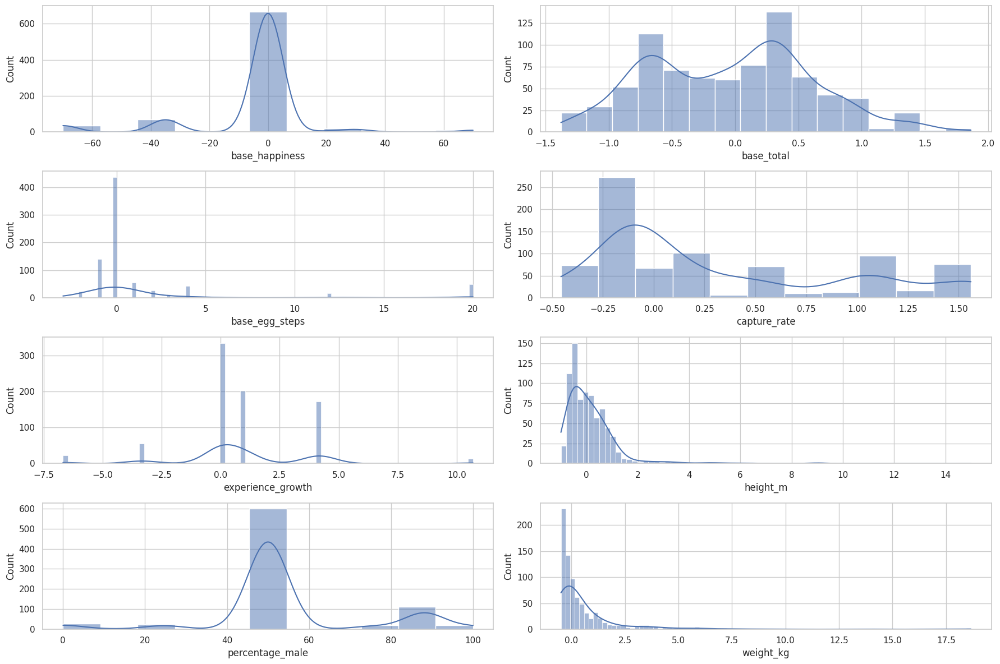

In [48]:
base_properties = ['base_happiness', 'base_total','base_egg_steps','capture_rate','experience_growth', 'height_m','percentage_male','weight_kg']
fig, axes = plt.subplots(4,2, figsize=(18, 12))

for i, col in enumerate(base_properties):
    sns.histplot(df[col], kde=True, ax=axes[i // 2, i % 2])
    axes[i // 2, i % 2].set_title(col.replace(base_properties[i], '').capitalize())

plt.tight_layout()
plt.show()

Now let us see the boxplot for the above columns to find the outliers and see the distribution of the values accross various generations and is_legendary

'base_happiness' : cant tell about geneartion dominance but legendary pokemons purely dominate
'base_total': equally distributed among the generations and dominated by non legendary pokemons
'base_egg_steps':  3 4 7 generations dominate and legendary pokemons dominate
'capture_rate': 1 3 5 genarions dominate and dominated by non legendary pokemons
'experience_growth': 3 4 7  genarions dominate and dominated by non legendary pokemons
'height_m': equally distributed among generations and dominated by legendary pokemons
'percentage_male': cant infer anything
'weight_kg':  equally distributed among generations and dominated by legendary pokemons

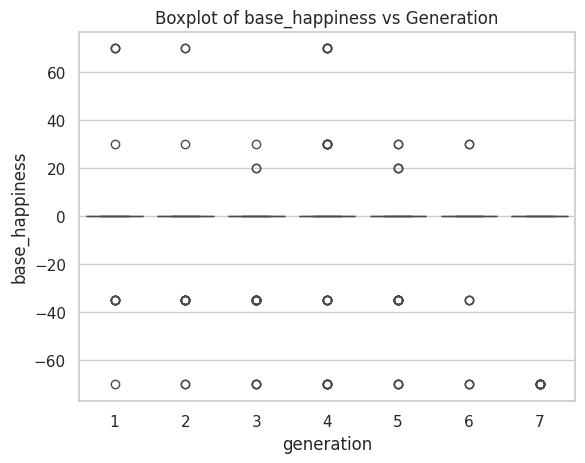

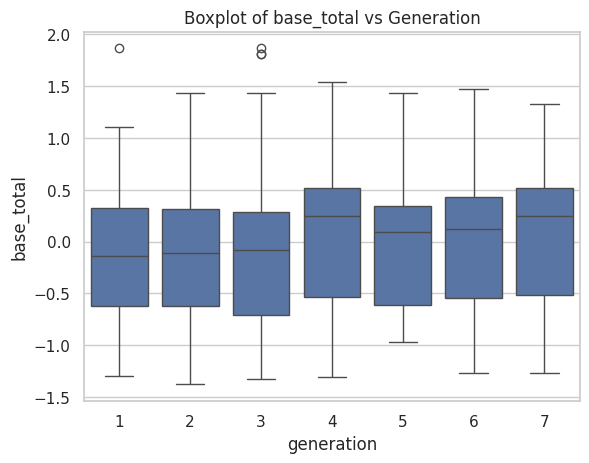

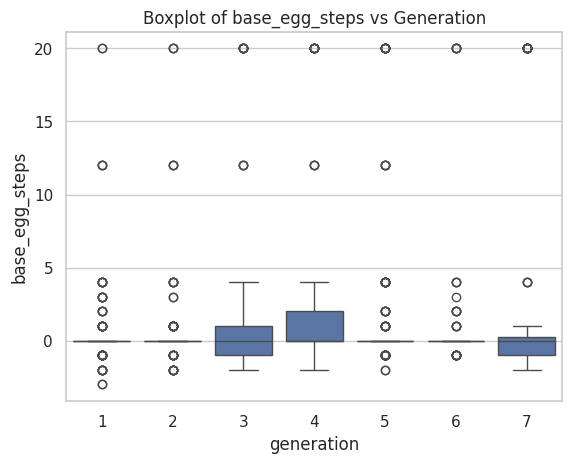

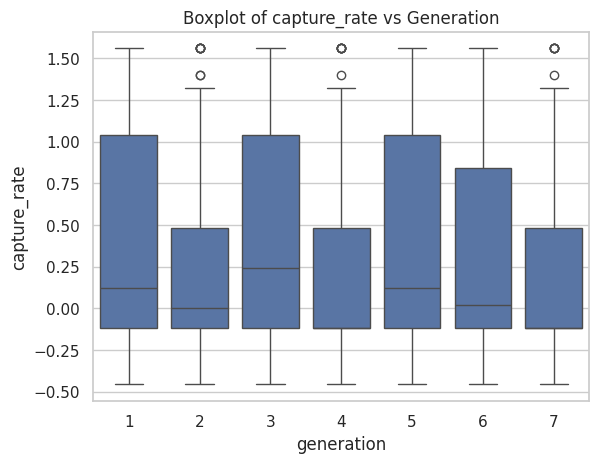

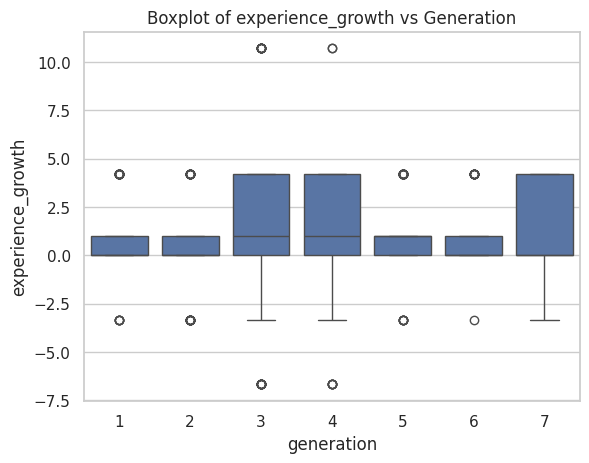

...

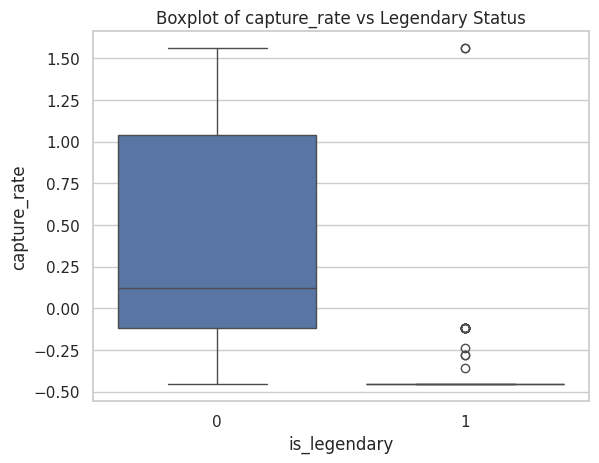

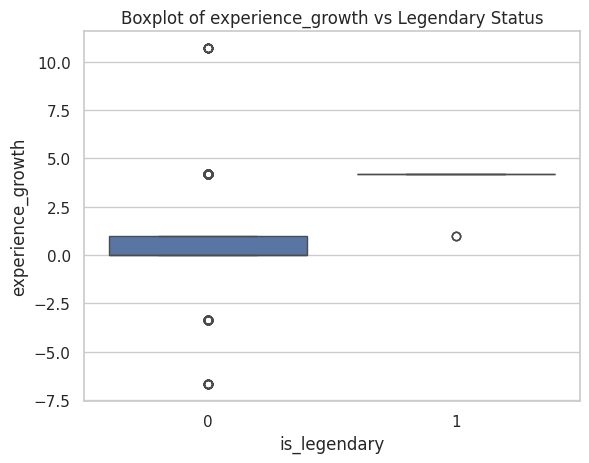

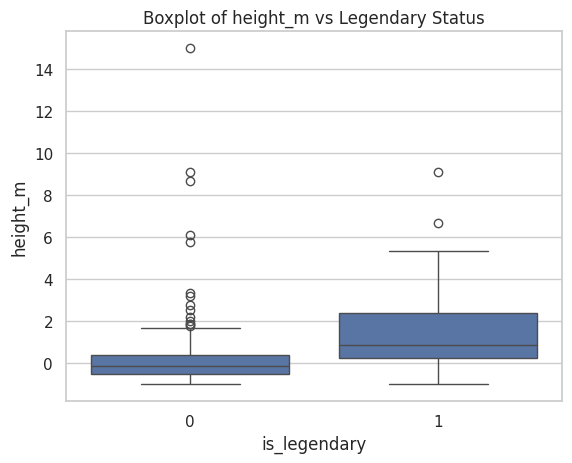

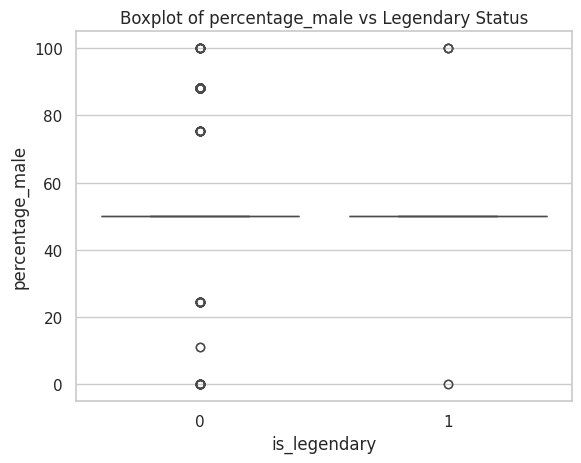

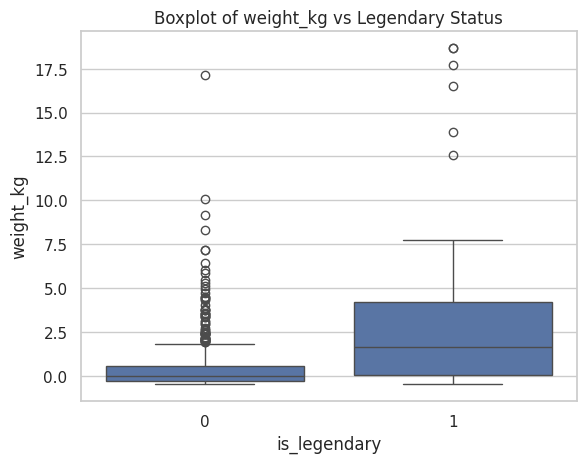

In [49]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame
base_properties= ['base_happiness', 'base_total','base_egg_steps','capture_rate','experience_growth', 'height_m','percentage_male','weight_kg',]

# Create boxplots for each 'against_' column with respect to 'generation'
for col in base_properties:
    plt.figure()  # Create a new figure for each plot
    sns.boxplot(x='generation', y=col, data=df)
    plt.title(f"Boxplot of {col} vs Generation")
    plt.show()

# Create boxplots for each 'against_' column with respect to 'is_legendary'
for col in base_properties:
    plt.figure()
    sns.boxplot(x='is_legendary', y=col, data=df)
    plt.title(f"Boxplot of {col} vs Legendary Status")
    plt.show()

Now let us see the scatterplot for the above columns to find the outliers and see the distribution of the values accross various generations and is_legendary

Features are equally distributed across the generations and now let us look at is_legendary:
'base_happiness' : nothing to infer
'base_total' : legendary dominance
'base_egg_steps' : legendary dominance
'capture_rate' : non legendary dominance
'experience_growth'  : non legendary dominance
'height_m' : non legendary dominance
'percentage_male' : non legendary dominance
'weight_kg' : legendary dominance

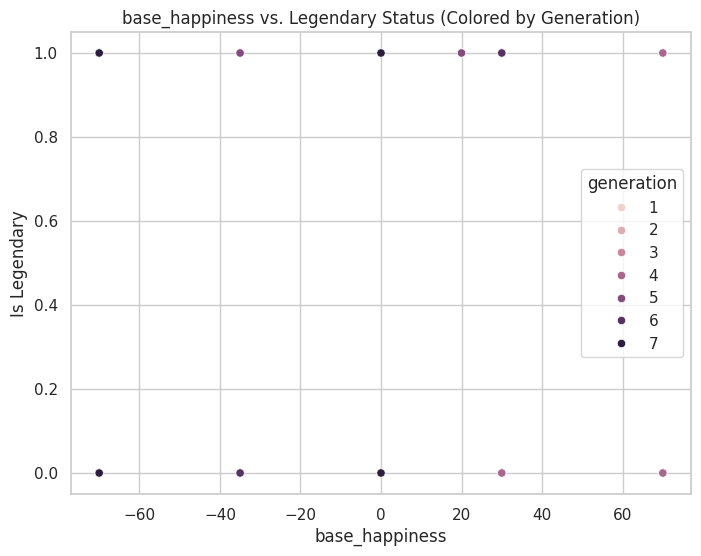

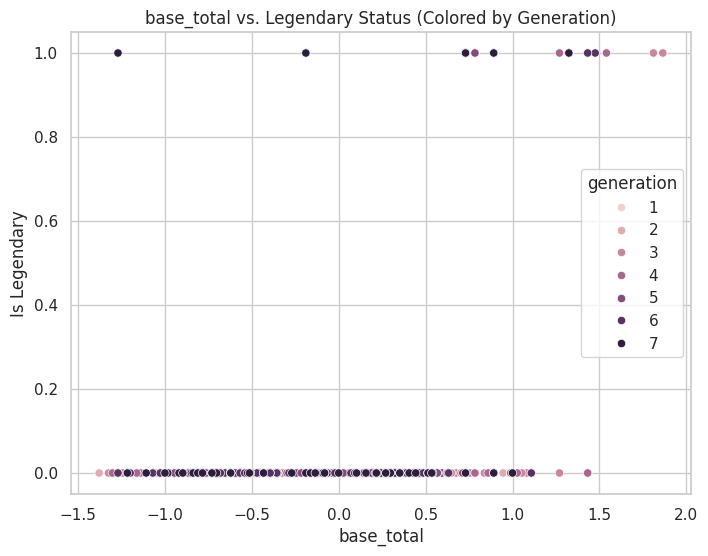

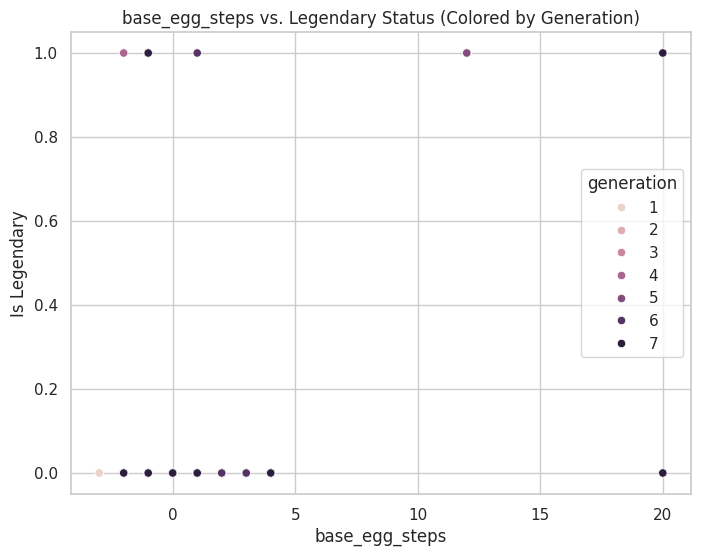

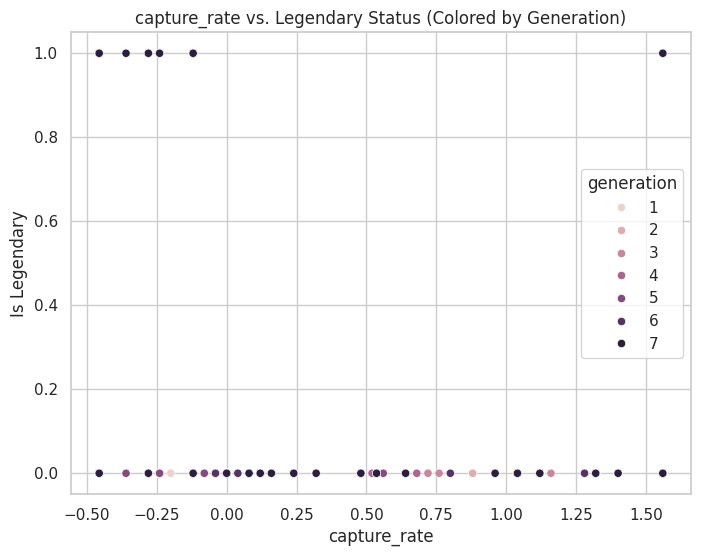

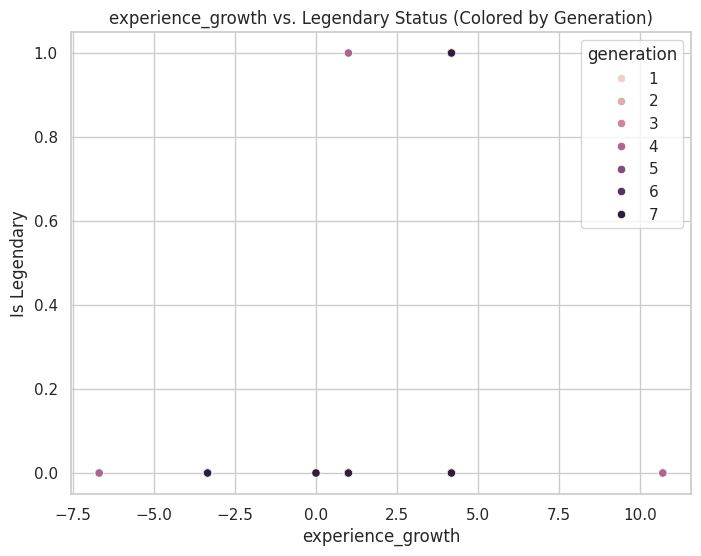

...

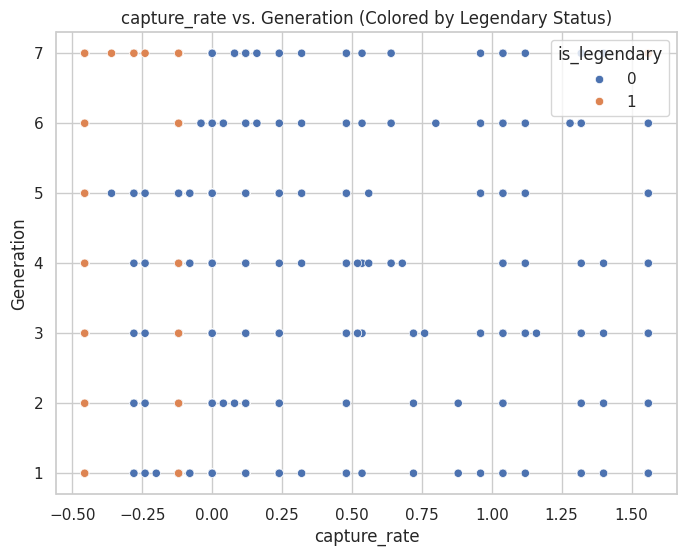

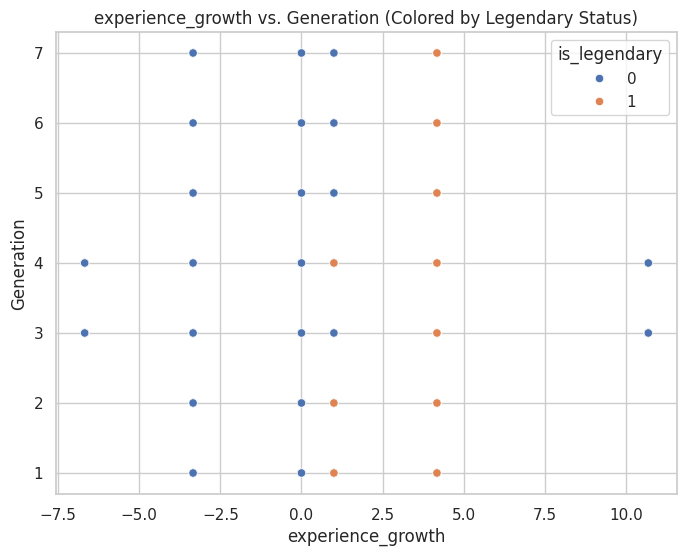

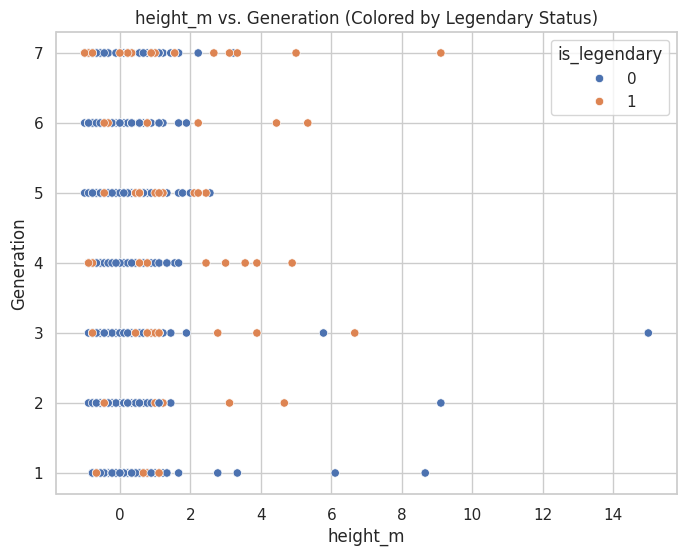

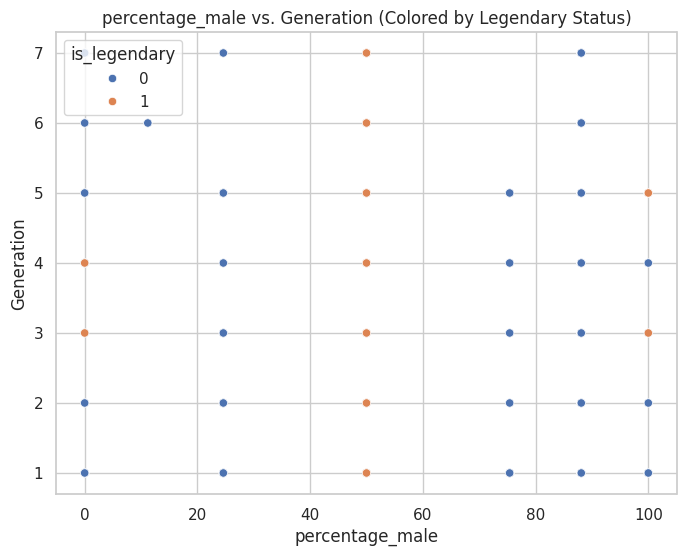

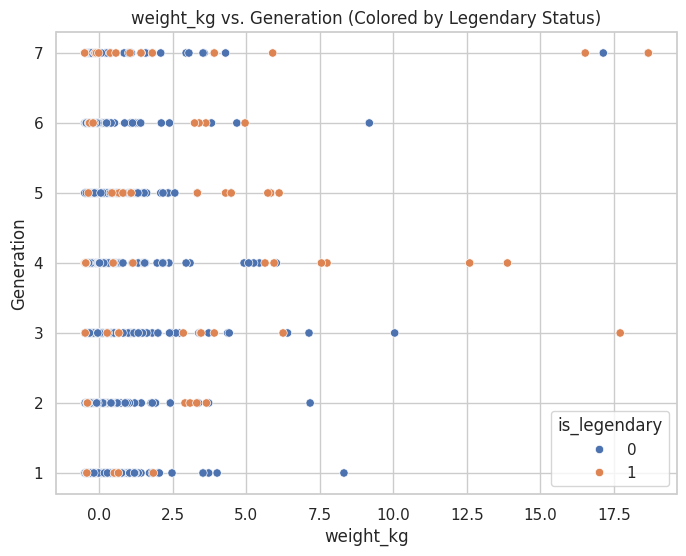

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is your DataFrame and it contains columns like
# 'is_legendary', 'generation', 'attack', 'defense', 'speed', etc.

features = ['base_happiness', 'base_total','base_egg_steps','capture_rate','experience_growth', 'height_m','percentage_male','weight_kg',]

# Scatter plots for features against 'is_legendary'
for feature in features:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=feature, y='is_legendary', data=df, hue='generation')
    plt.title(f'{feature} vs. Legendary Status (Colored by Generation)')
    plt.xlabel(feature)
    plt.ylabel('Is Legendary')
    plt.show()

# Scatter plots for features against 'generation'
for feature in features:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=feature, y='generation', data=df, hue='is_legendary')
    plt.title(f'{feature} vs. Generation (Colored by Legendary Status)')
    plt.xlabel(feature)
    plt.ylabel('Generation')
    plt.show()

Now let us see the boxplot for the above columns to find the outliers and see the distribution of the values accross varios type1_en and type2_en

    'base_happiness', 'base_egg_steps', 'height_m', 'percentage_male', 'weight_kg' have more outliers when compared to both type1_en and type2_en .remaining are distributed well in the boxplot

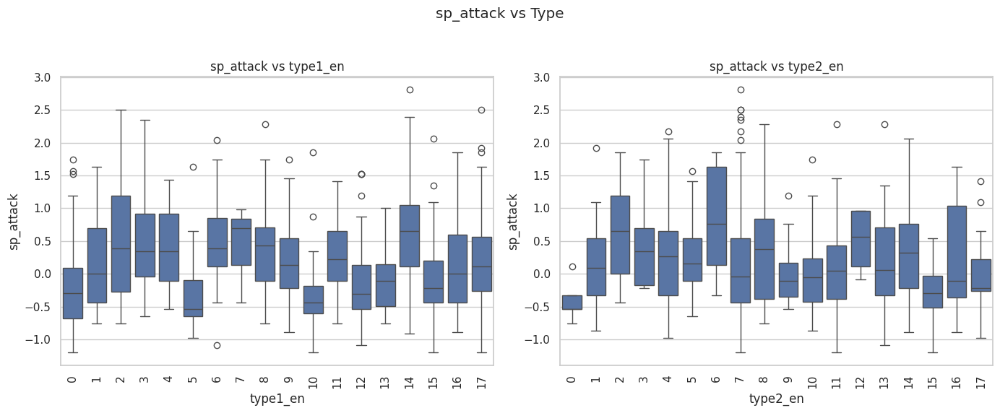

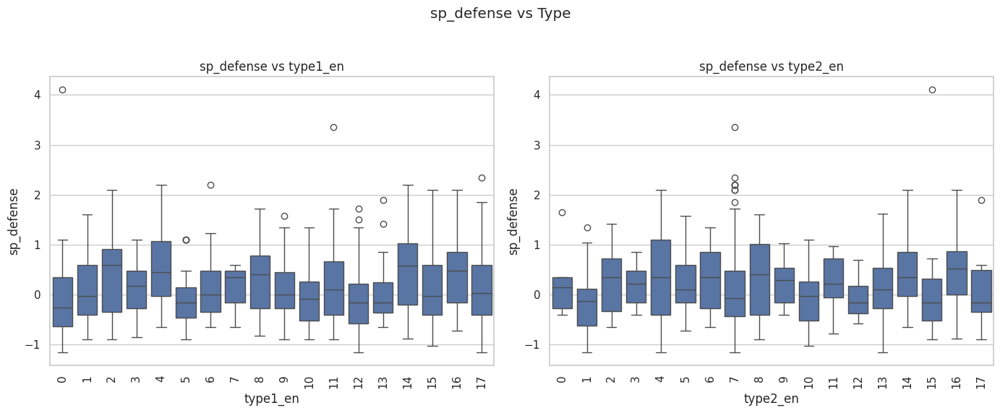

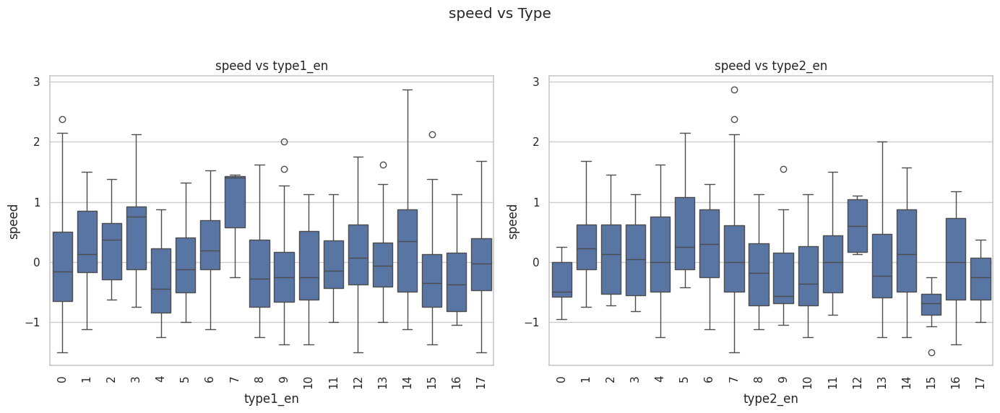

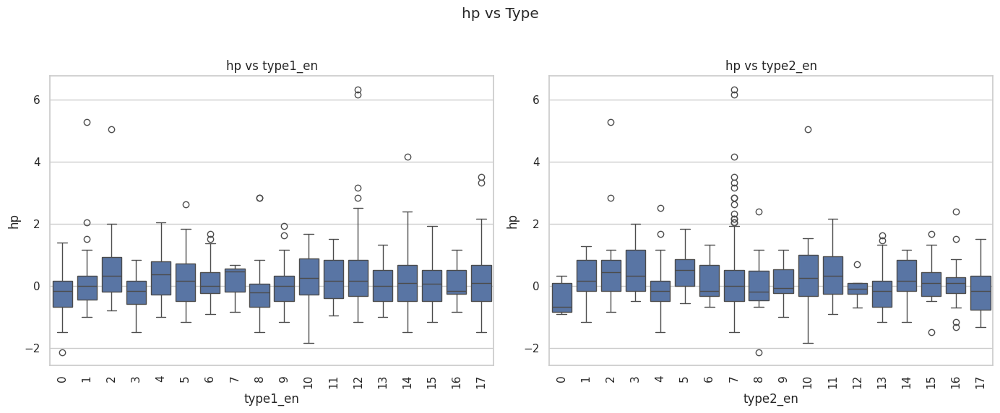

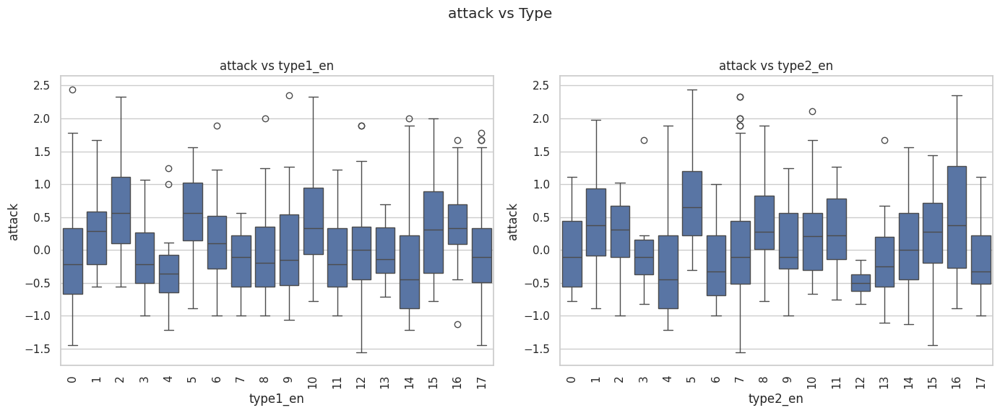

...

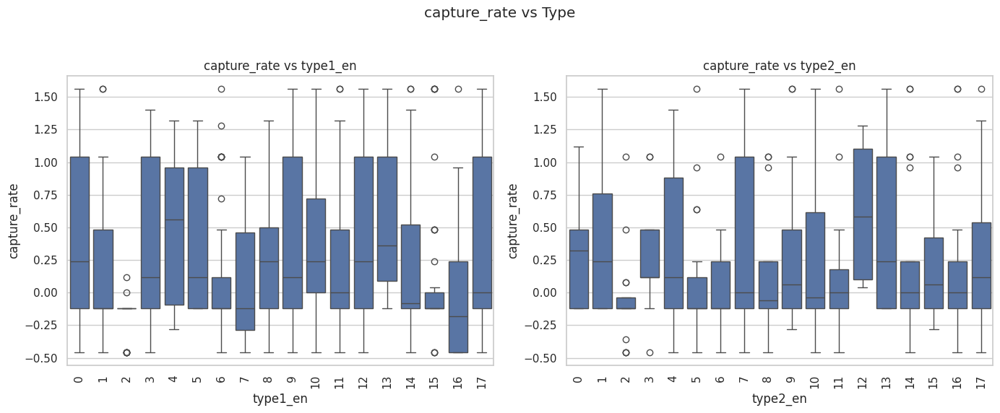

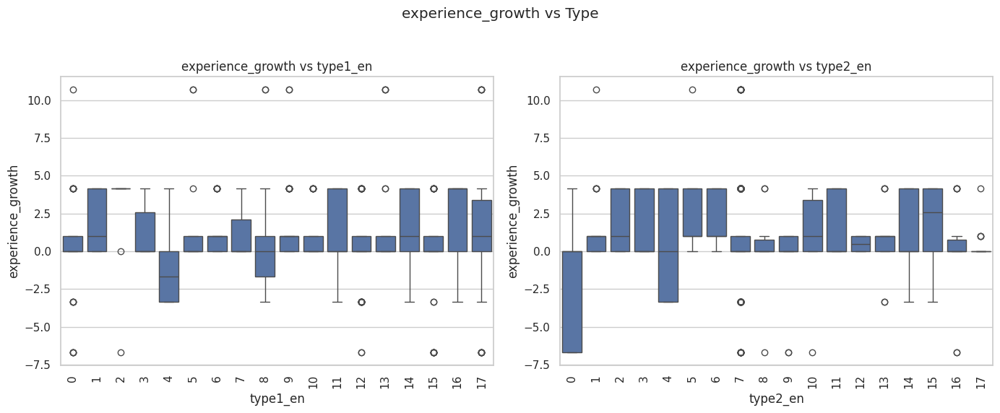

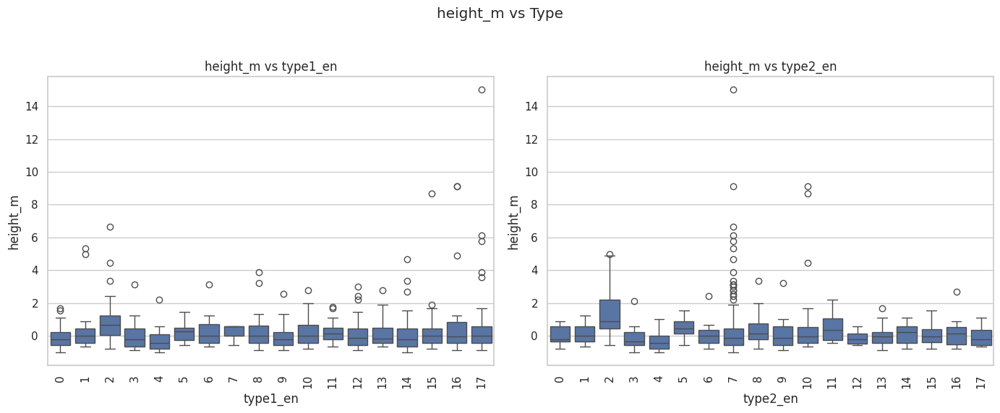

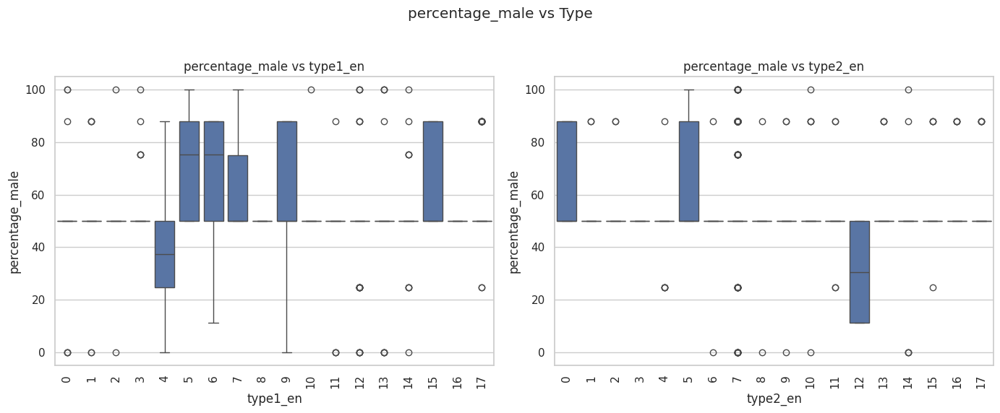

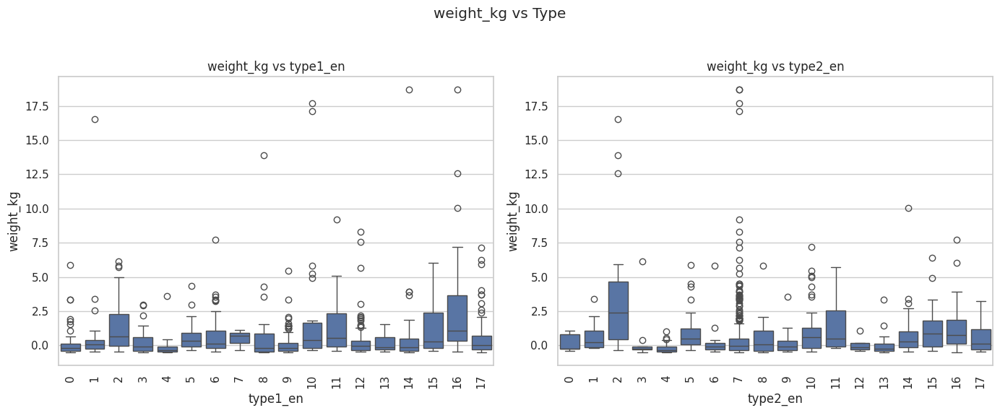

In [51]:
# List of features to plot
features = [
    'sp_attack', 'sp_defense', 'speed', 'hp', 'attack', 'defense',
    'base_happiness', 'base_total', 'base_egg_steps', 'capture_rate',
    'experience_growth', 'height_m', 'percentage_male', 'weight_kg'
]

# Plotting each feature against type1_en and type2_en
for feature in features:
    plt.figure(figsize=(14, 6))
    plt.suptitle(f'{feature} vs Type')

    # Plot against type1_en
    plt.subplot(1, 2, 1)
    sns.boxplot(x='type1_en', y=feature, data=df)
    plt.title(f'{feature} vs type1_en')
    plt.xticks(rotation=90)

    # Plot against type2_en
    plt.subplot(1, 2, 2)
    sns.boxplot(x='type2_en', y=feature, data=df)
    plt.title(f'{feature} vs type2_en')
    plt.xticks(rotation=90)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

Now let us see the scatterplot for the above columns to find the outliers and see the distribution of the values accross varios type1_en and type2_en

 type1_en  12.5 to 15 are dominant in few areas,type2_en  5 to 7.5 are dominant in few areas but mostly all tpes have equal weightage

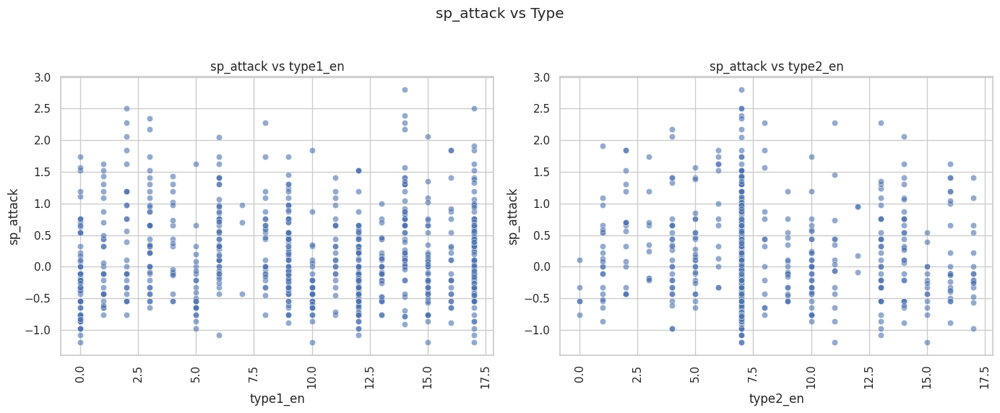

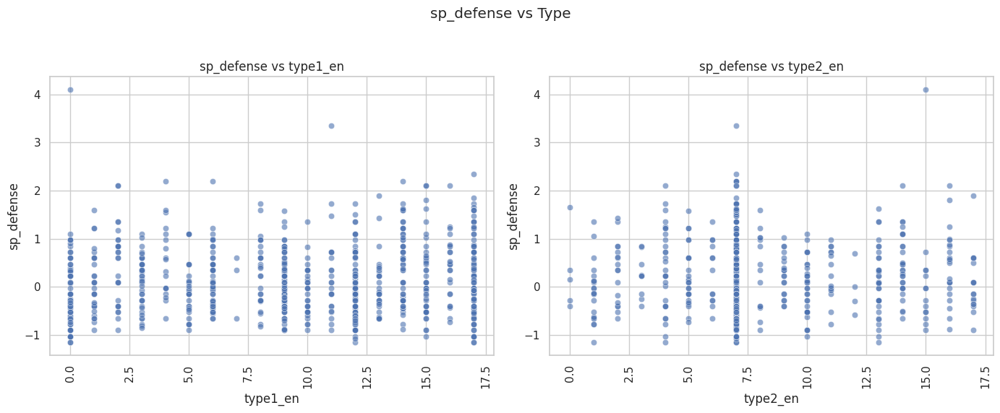

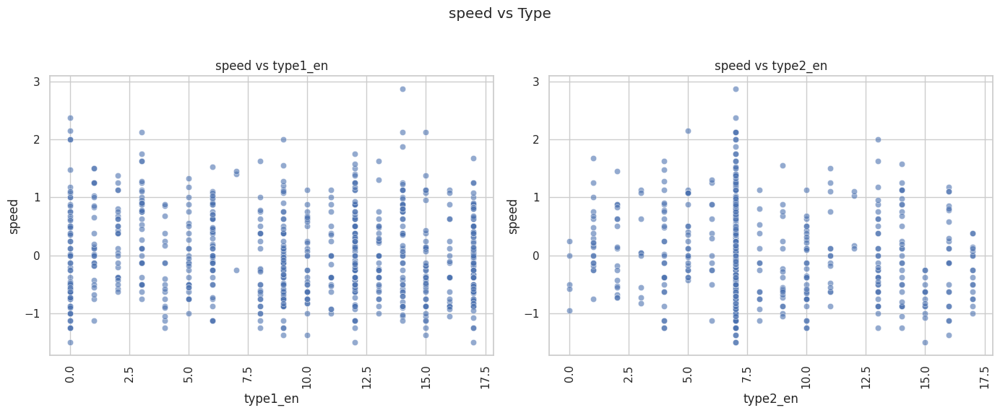

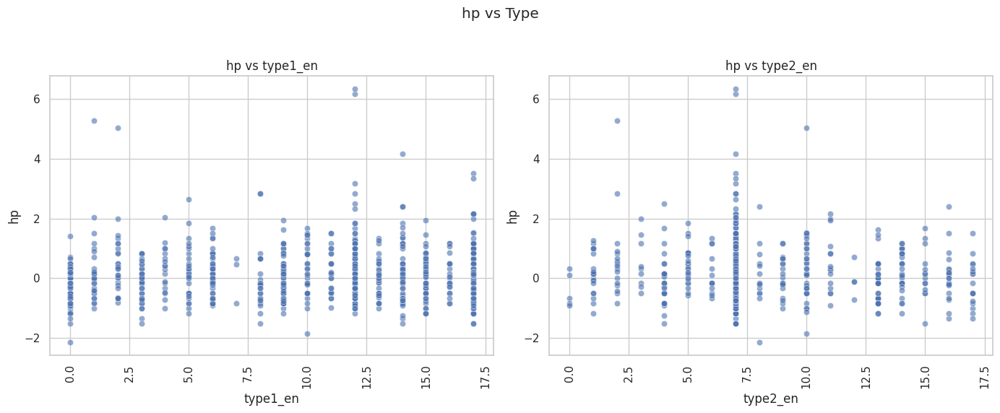

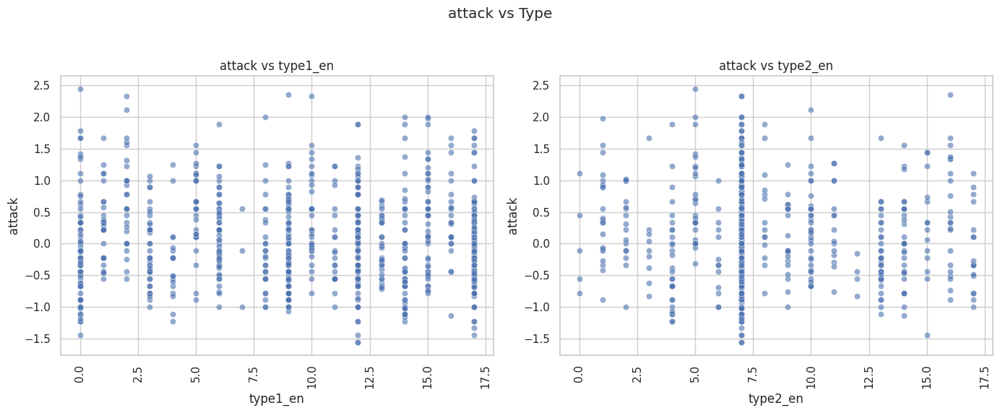

...

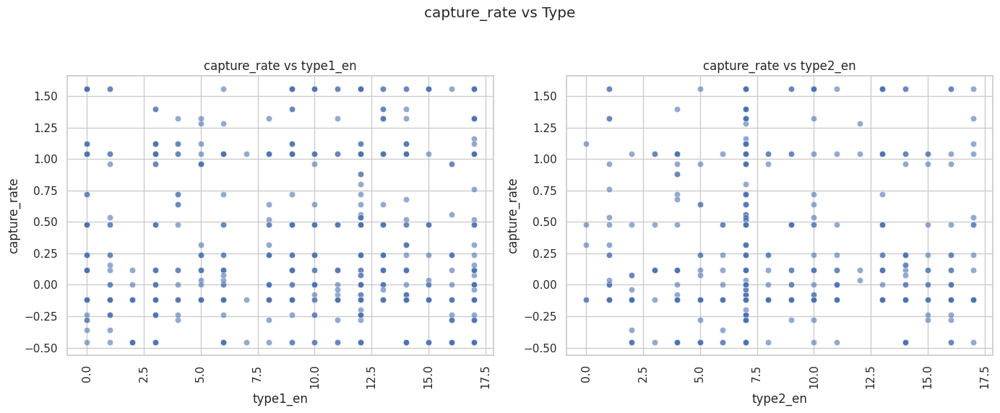

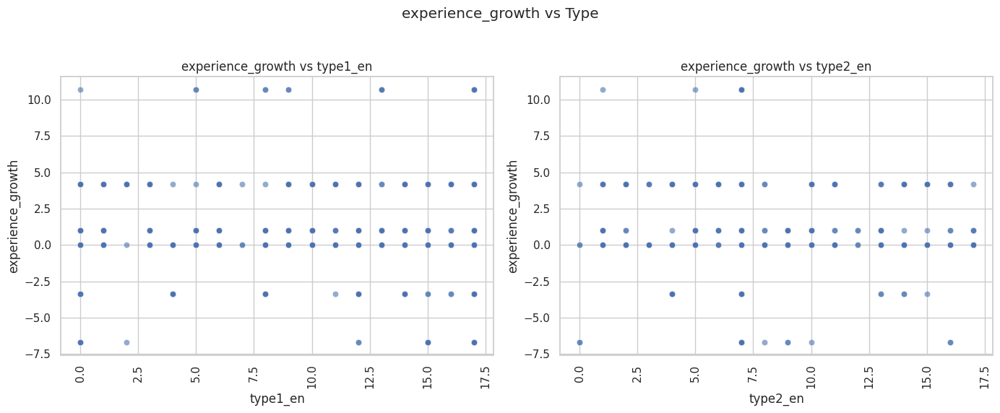

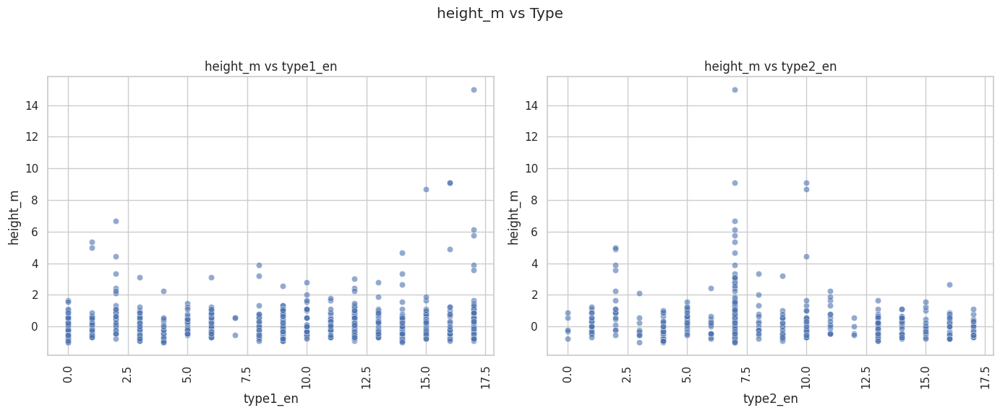

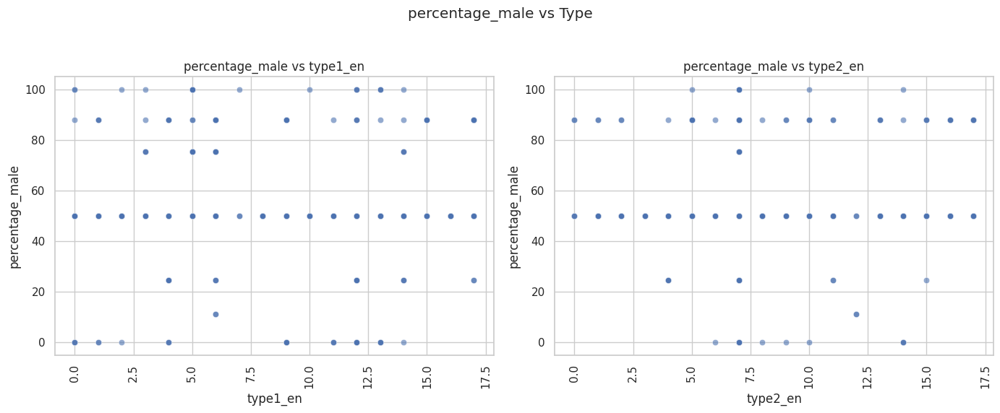

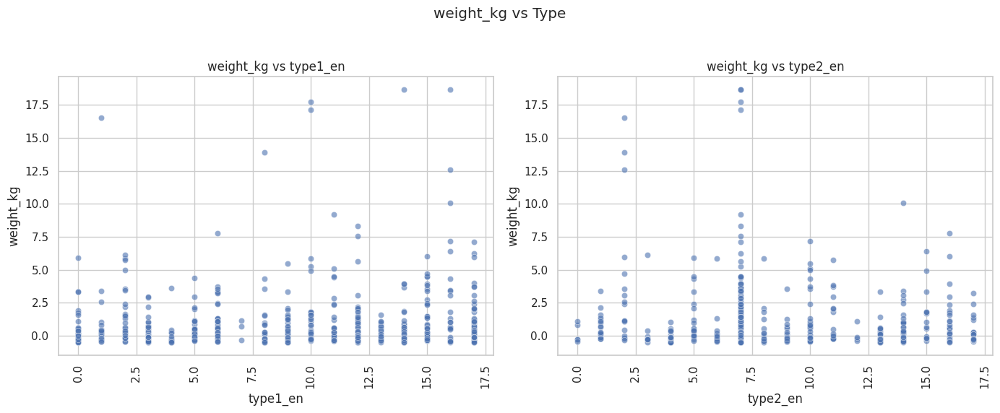

In [52]:
features = [
    'sp_attack', 'sp_defense', 'speed', 'hp', 'attack', 'defense',
    'base_happiness', 'base_total', 'base_egg_steps', 'capture_rate',
    'experience_growth', 'height_m', 'percentage_male', 'weight_kg'
]

# Plotting each feature against type1_en and type2_en
for feature in features:
    plt.figure(figsize=(14, 6))
    plt.suptitle(f'{feature} vs Type')

    # Plot against type1_en
    plt.subplot(1, 2, 1)
    sns.scatterplot(x='type1_en', y=feature, data=df, alpha=0.6)
    plt.title(f'{feature} vs type1_en')
    plt.xticks(rotation=90)

    # Plot against type2_en
    plt.subplot(1, 2, 2)
    sns.scatterplot(x='type2_en', y=feature, data=df, alpha=0.6)
    plt.title(f'{feature} vs type2_en')
    plt.xticks(rotation=90)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

Now consider the following plots where we try to compare various base features and try to find the relations between them

defense and weight_kg have less number of outliers

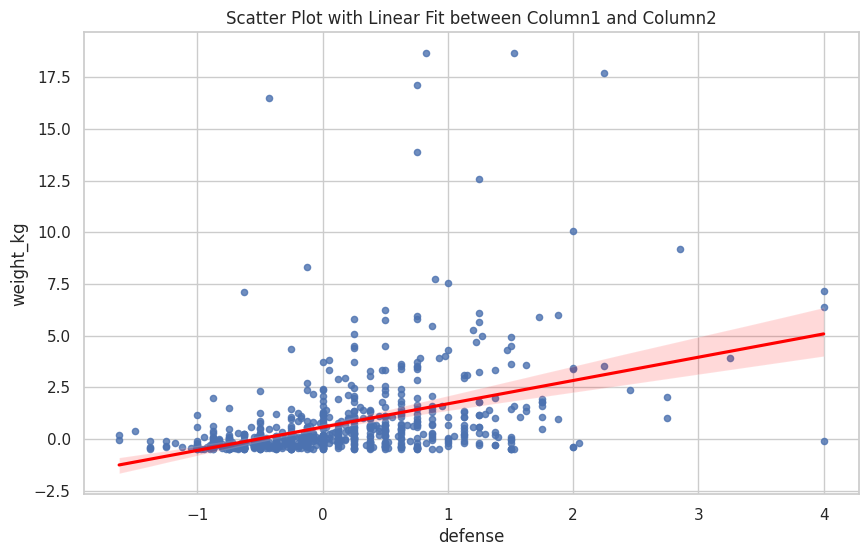

In [53]:
# Plot the scatter plot with a line of best fit
plt.figure(figsize=(10, 6))
sns.regplot(x='defense', y='weight_kg', data=df, scatter_kws={'s': 20}, line_kws={"color":"red"})
plt.title('Scatter Plot with Linear Fit between Column1 and Column2')
plt.xlabel('defense')
plt.ylabel('weight_kg')
plt.show()

hp and weight_kg have less number of outliers

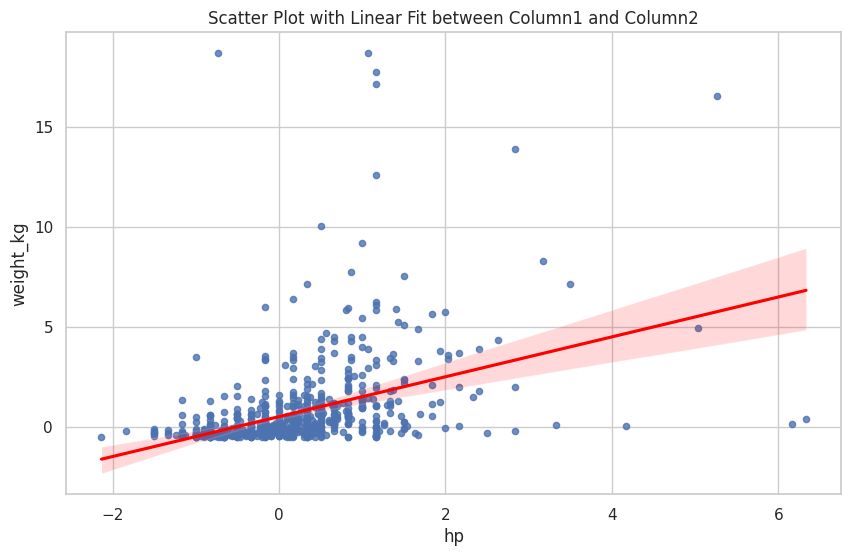

In [54]:
# Plot the scatter plot with a line of best fit
plt.figure(figsize=(10, 6))
sns.regplot(x='hp', y='weight_kg', data=df, scatter_kws={'s': 20}, line_kws={"color":"red"})
plt.title('Scatter Plot with Linear Fit between Column1 and Column2')
plt.xlabel('hp')
plt.ylabel('weight_kg')
plt.show()

defense and hp have less number of outliers

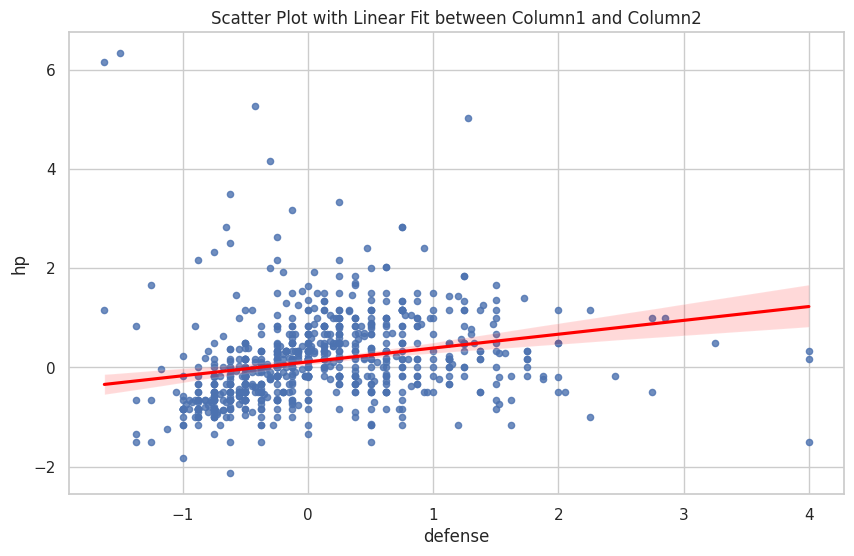

In [55]:
# Plot the scatter plot with a line of best fit
plt.figure(figsize=(10, 6))
sns.regplot(x='defense', y='hp', data=df, scatter_kws={'s': 20}, line_kws={"color":"red"})
plt.title('Scatter Plot with Linear Fit between Column1 and Column2')
plt.xlabel('defense')
plt.ylabel('hp')
plt.show()

attack and sp_attack  have less number of outliers and compared to previous comparisions have linear relation more

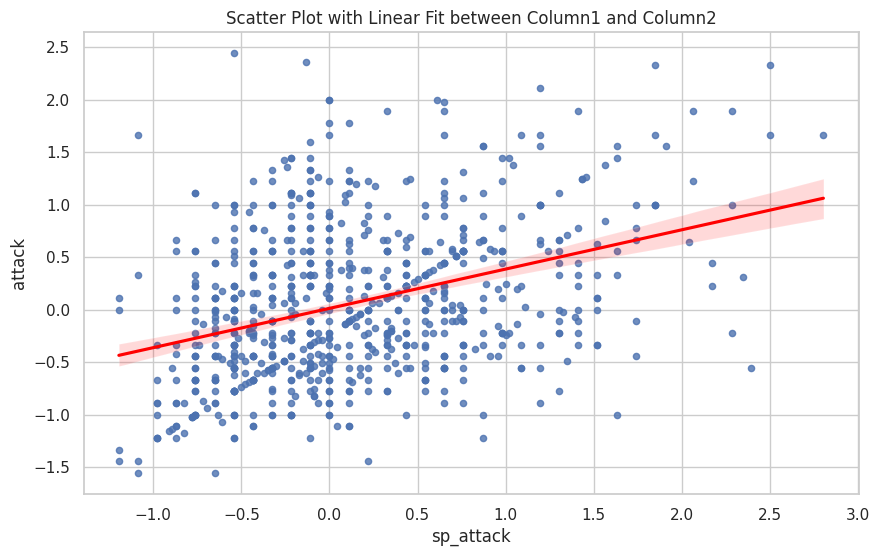

In [56]:
# Plot the scatter plot with a line of best fit
plt.figure(figsize=(10, 6))
sns.regplot(x='sp_attack', y='attack', data=df, scatter_kws={'s': 20}, line_kws={"color":"red"})
plt.title('Scatter Plot with Linear Fit between Column1 and Column2')
plt.xlabel('sp_attack')
plt.ylabel('attack')
plt.show()

defense and sp_defense have less number of outliers and compared to previous comparisions have linear relation more

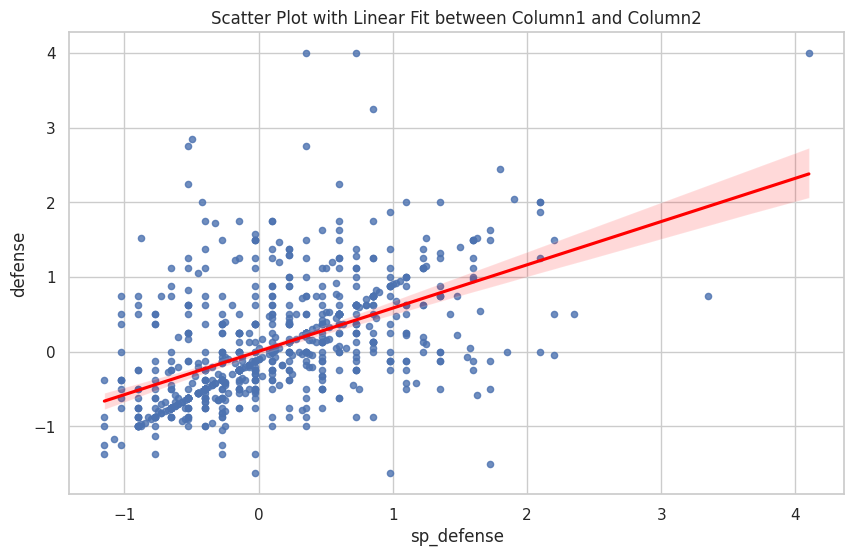

In [57]:
# Plot the scatter plot with a line of best fit
plt.figure(figsize=(10, 6))
sns.regplot(x='sp_defense', y='defense', data=df, scatter_kws={'s': 20}, line_kws={"color":"red"})
plt.title('Scatter Plot with Linear Fit between Column1 and Column2')
plt.xlabel('sp_defense')
plt.ylabel('defense')
plt.show()

As coreelation does not mean cusation . we cannot infer much from the below analysis

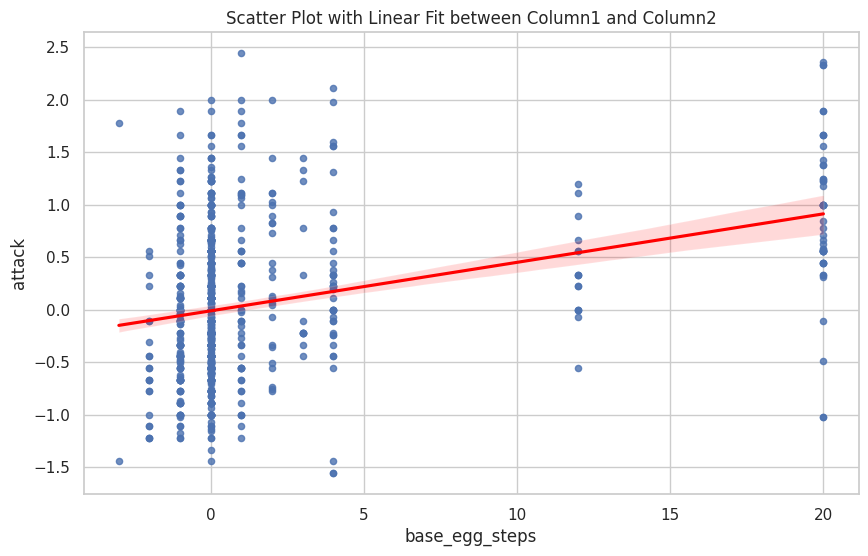

In [58]:
# Plot the scatter plot with a line of best fit
plt.figure(figsize=(10, 6))
sns.regplot(x='base_egg_steps', y='attack', data=df, scatter_kws={'s': 20}, line_kws={"color":"red"})
plt.title('Scatter Plot with Linear Fit between Column1 and Column2')
plt.xlabel('base_egg_steps')
plt.ylabel('attack')
plt.show()

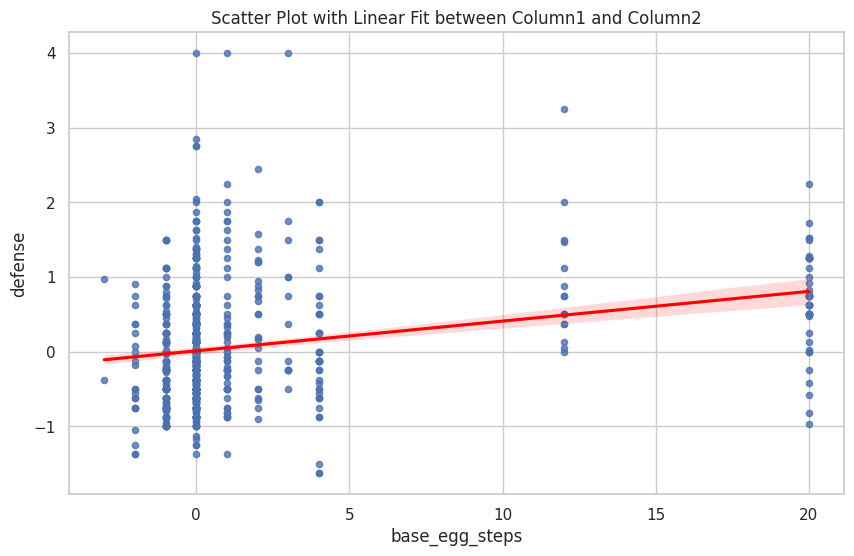

In [59]:
# Plot the scatter plot with a line of best fit
plt.figure(figsize=(10, 6))
sns.regplot(x='base_egg_steps', y='defense', data=df, scatter_kws={'s': 20}, line_kws={"color":"red"})
plt.title('Scatter Plot with Linear Fit between Column1 and Column2')
plt.xlabel('base_egg_steps')
plt.ylabel('defense')
plt.show()

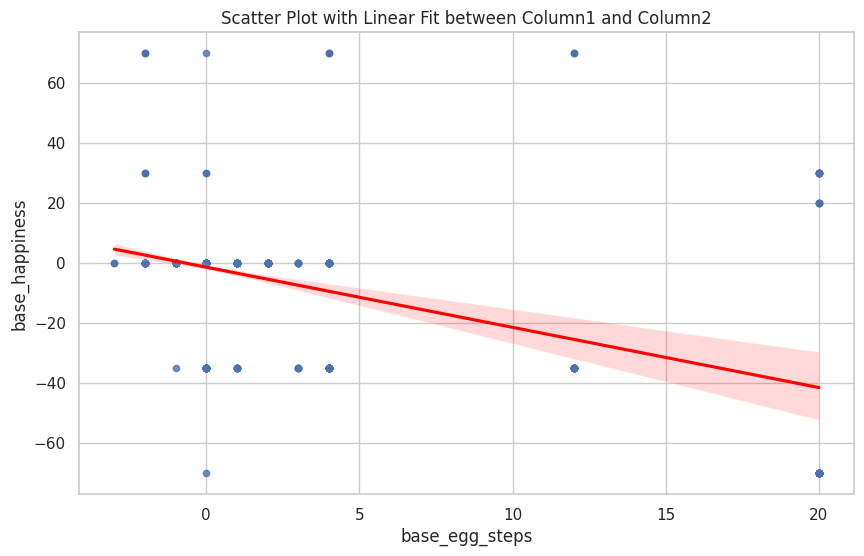

In [60]:
# Plot the scatter plot with a line of best fit
plt.figure(figsize=(10, 6))
sns.regplot(x='base_egg_steps', y='base_happiness', data=df, scatter_kws={'s': 20}, line_kws={"color":"red"})
plt.title('Scatter Plot with Linear Fit between Column1 and Column2')
plt.xlabel('base_egg_steps')
plt.ylabel('base_happiness')
plt.show()

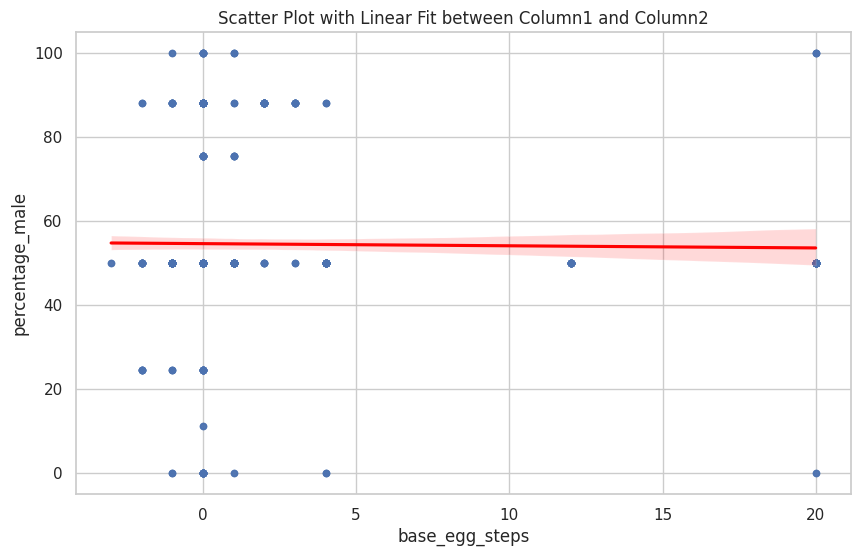

In [61]:
# Plot the scatter plot with a line of best fit
plt.figure(figsize=(10, 6))
sns.regplot(x='base_egg_steps', y='percentage_male', data=df, scatter_kws={'s': 20}, line_kws={"color":"red"})
plt.title('Scatter Plot with Linear Fit between Column1 and Column2')
plt.xlabel('base_egg_steps')
plt.ylabel('percentage_male')
plt.show()

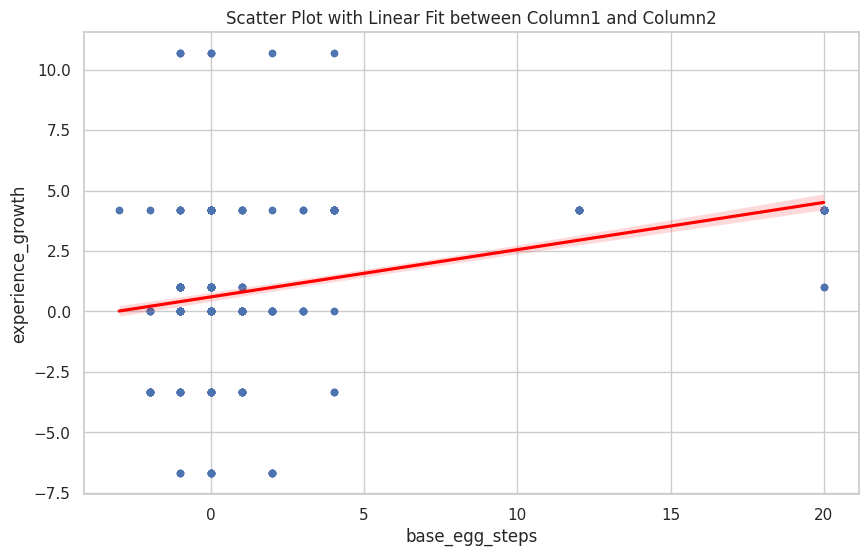

In [62]:
# Plot the scatter plot with a line of best fit
plt.figure(figsize=(10, 6))
sns.regplot(x='base_egg_steps', y='experience_growth', data=df, scatter_kws={'s': 20}, line_kws={"color":"red"})
plt.title('Scatter Plot with Linear Fit between Column1 and Column2')
plt.xlabel('base_egg_steps')
plt.ylabel('experience_growth')
plt.show()

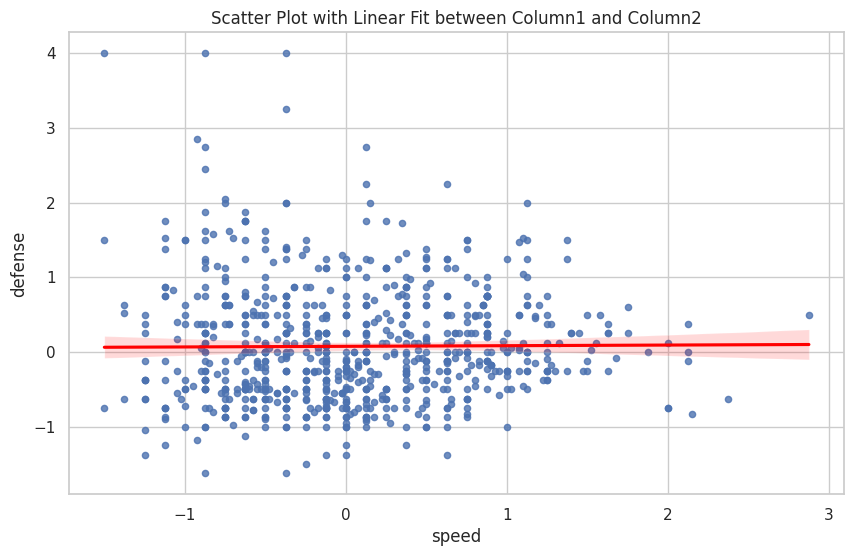

In [63]:
# Plot the scatter plot with a line of best fit
plt.figure(figsize=(10, 6))
sns.regplot(x='speed', y='defense', data=df, scatter_kws={'s': 20}, line_kws={"color":"red"})
plt.title('Scatter Plot with Linear Fit between Column1 and Column2')
plt.xlabel('speed')
plt.ylabel('defense')
plt.show()

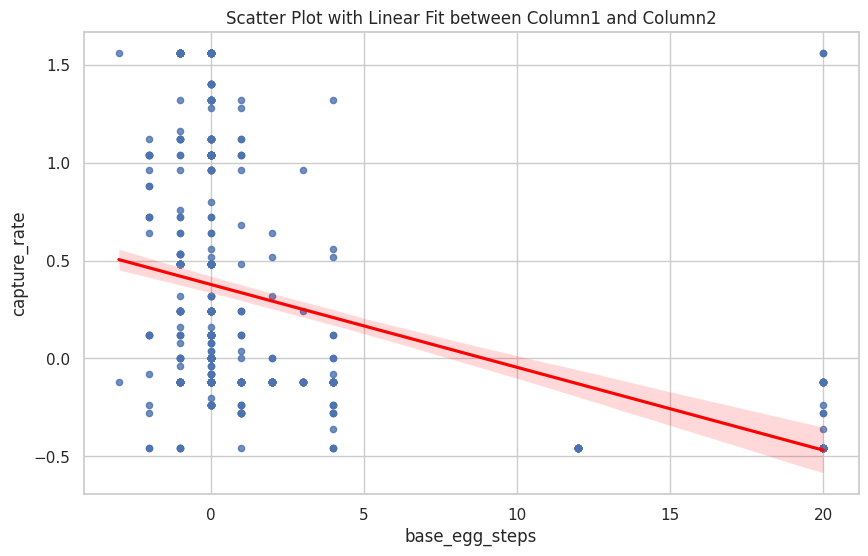

In [64]:
# Plot the scatter plot with a line of best fit
plt.figure(figsize=(10, 6))
sns.regplot(x='base_egg_steps', y='capture_rate', data=df, scatter_kws={'s': 20}, line_kws={"color":"red"})
plt.title('Scatter Plot with Linear Fit between Column1 and Column2')
plt.xlabel('base_egg_steps')
plt.ylabel('capture_rate')
plt.show()

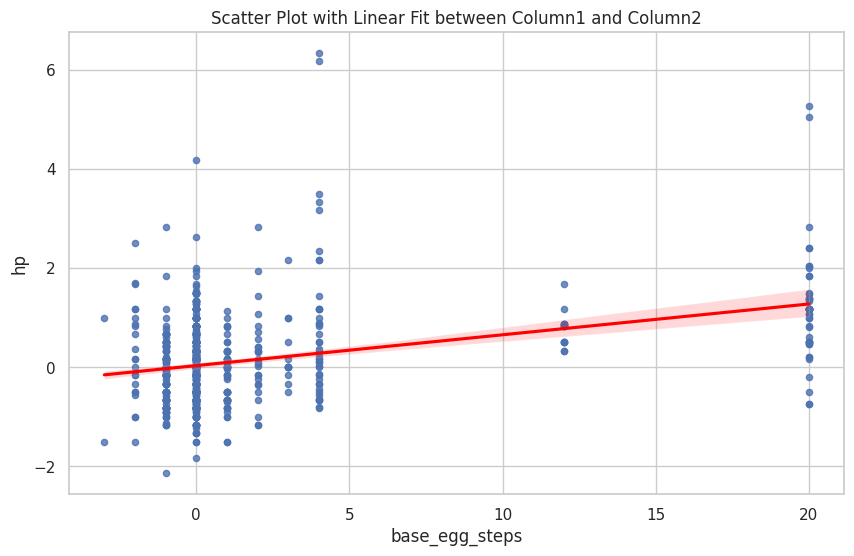

In [65]:
# Plot the scatter plot with a line of best fit
plt.figure(figsize=(10, 6))
sns.regplot(x='base_egg_steps', y='hp', data=df, scatter_kws={'s': 20}, line_kws={"color":"red"})
plt.title('Scatter Plot with Linear Fit between Column1 and Column2')
plt.xlabel('base_egg_steps')
plt.ylabel('hp')
plt.show()

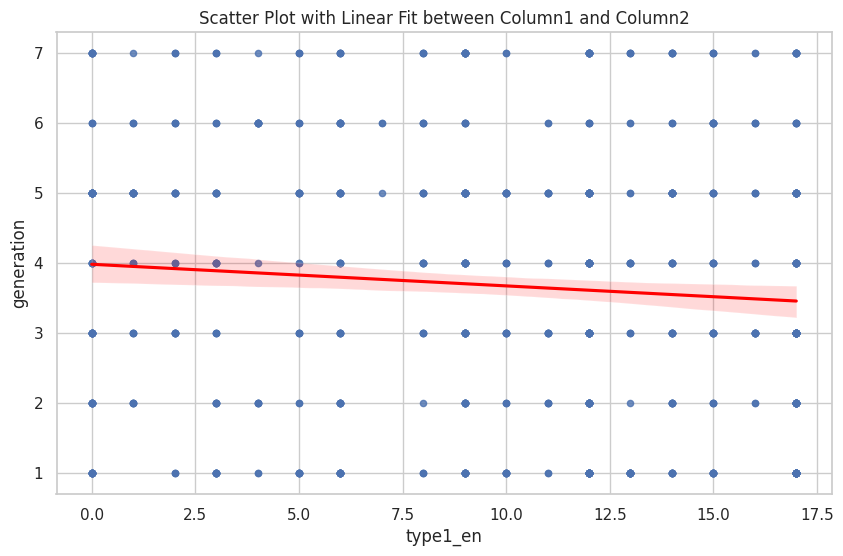

In [66]:
# Plot the scatter plot with a line of best fit
plt.figure(figsize=(10, 6))
sns.regplot(x='type1_en', y='generation', data=df, scatter_kws={'s': 20}, line_kws={"color":"red"})
plt.title('Scatter Plot with Linear Fit between Column1 and Column2')
plt.xlabel('type1_en')
plt.ylabel('generation')
plt.show()

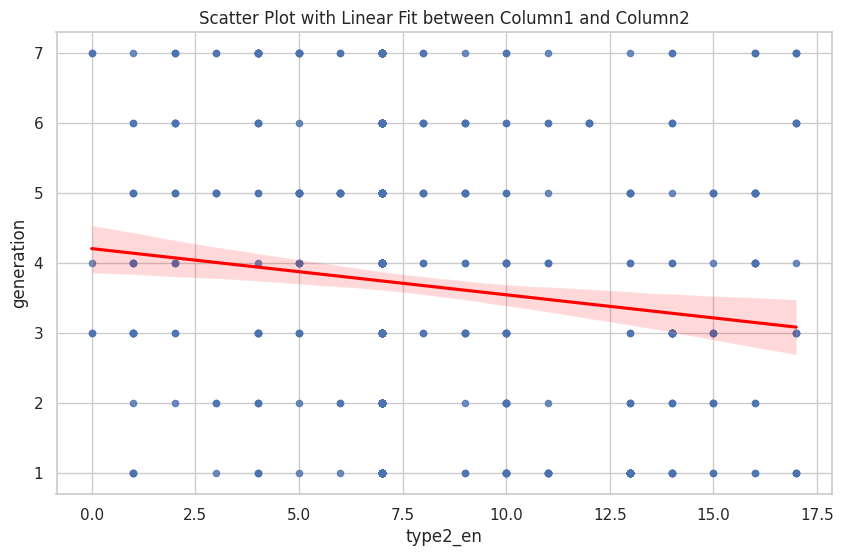

In [67]:
# Plot the scatter plot with a line of best fit
plt.figure(figsize=(10, 6))
sns.regplot(x='type2_en', y='generation', data=df, scatter_kws={'s': 20}, line_kws={"color":"red"})
plt.title('Scatter Plot with Linear Fit between Column1 and Column2')
plt.xlabel('type2_en')
plt.ylabel('generation')
plt.show()

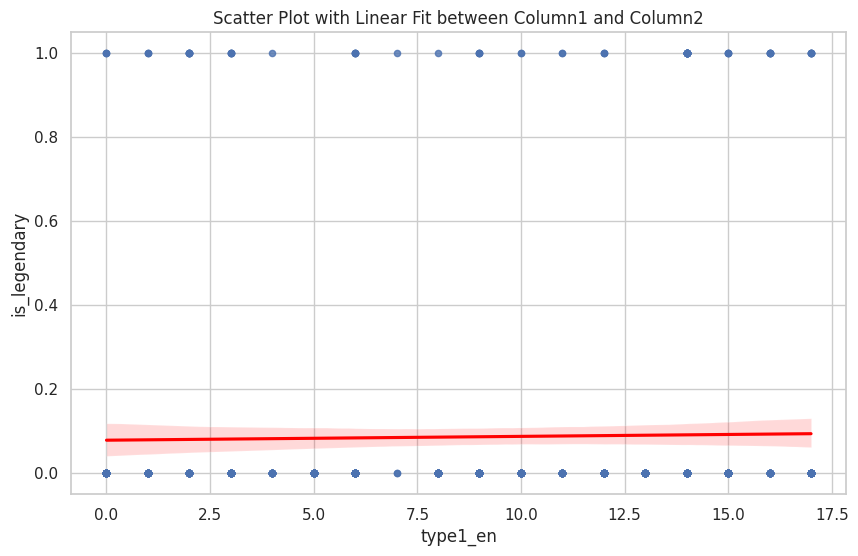

In [68]:
# Plot the scatter plot with a line of best fit
plt.figure(figsize=(10, 6))
sns.regplot(x='type1_en', y='is_legendary', data=df, scatter_kws={'s': 20}, line_kws={"color":"red"})
plt.title('Scatter Plot with Linear Fit between Column1 and Column2')
plt.xlabel('type1_en')
plt.ylabel('is_legendary')
plt.show()

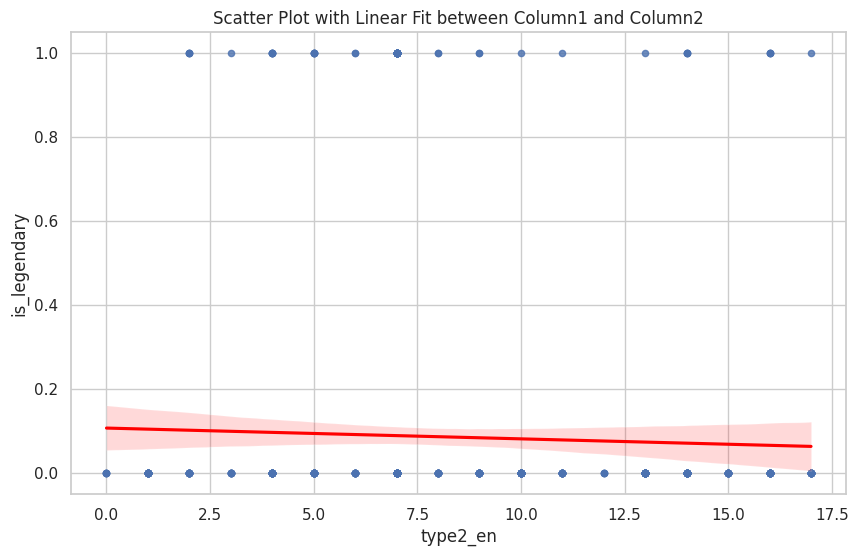

In [69]:
# Plot the scatter plot with a line of best fit
plt.figure(figsize=(10, 6))
sns.regplot(x='type2_en', y='is_legendary', data=df, scatter_kws={'s': 20}, line_kws={"color":"red"})
plt.title('Scatter Plot with Linear Fit between Column1 and Column2')
plt.xlabel('type2_en')
plt.ylabel('is_legendary')
plt.show()

base_total is positively correlated with attack,defense,speed,hp,sp_attack,sp_defense,height_m.weight_kg

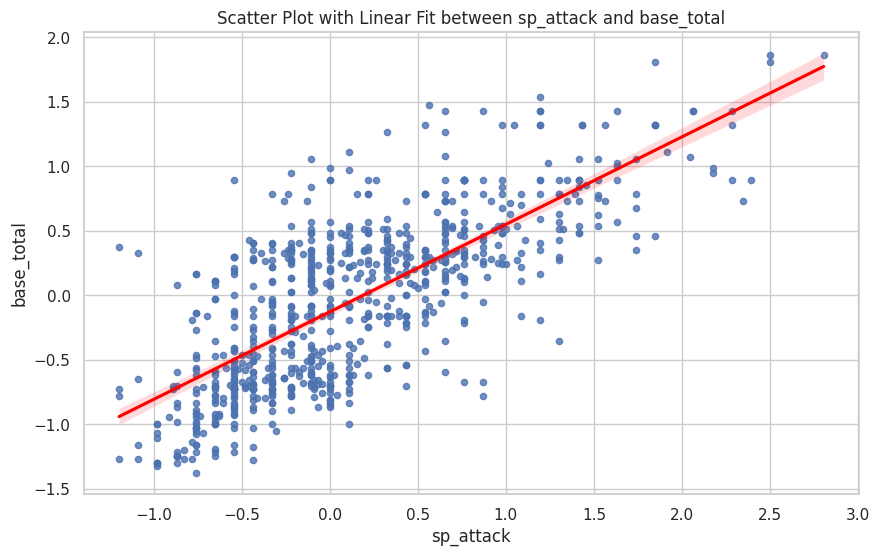

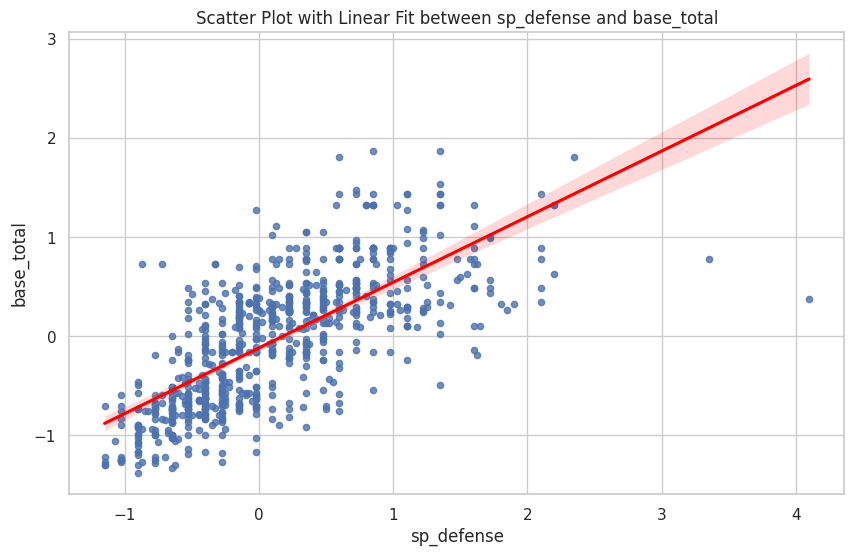

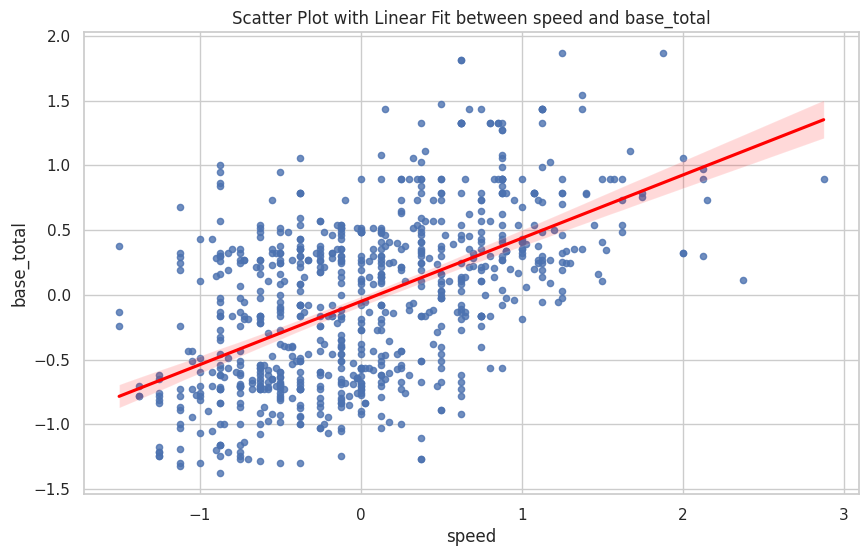

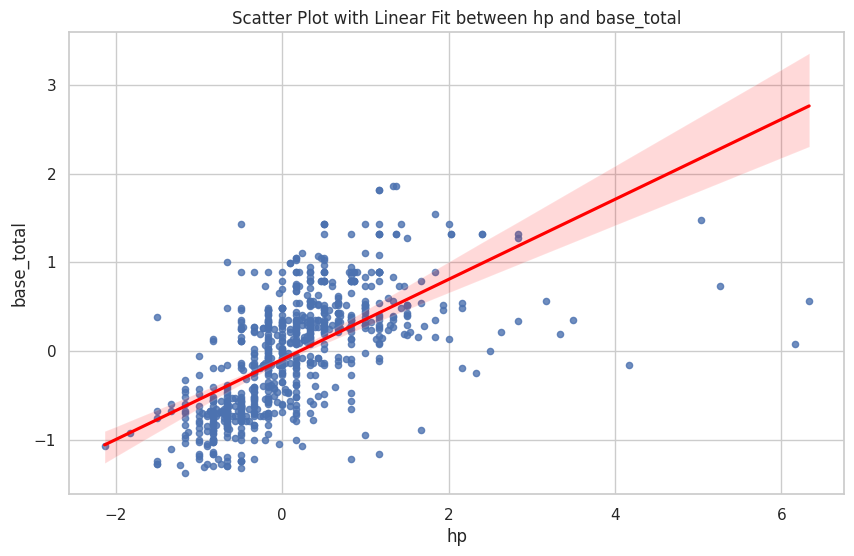

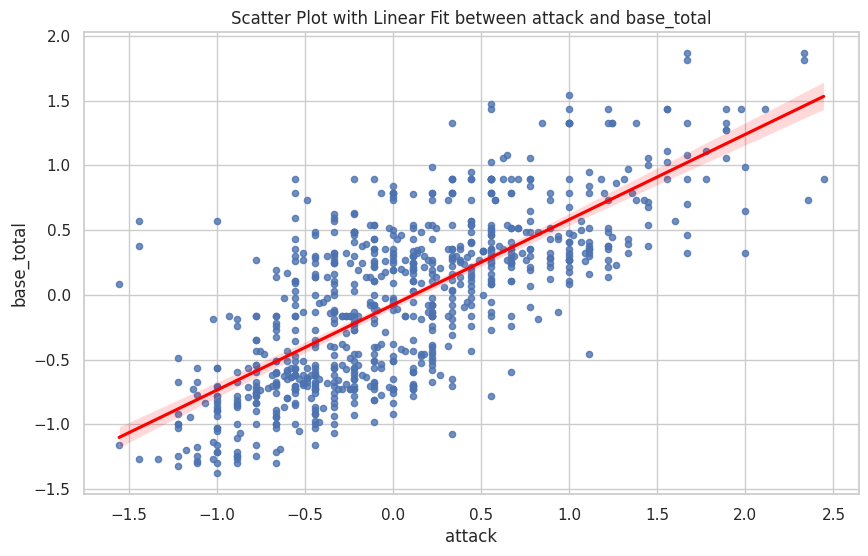

...

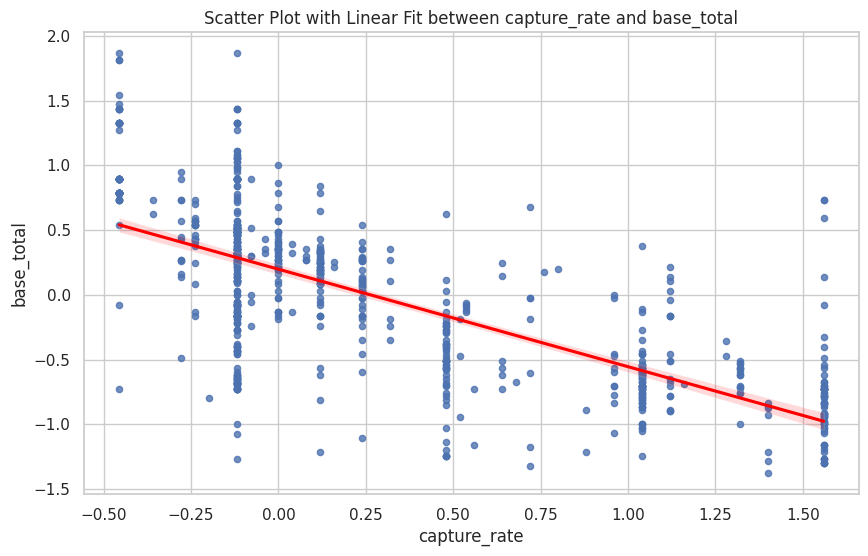

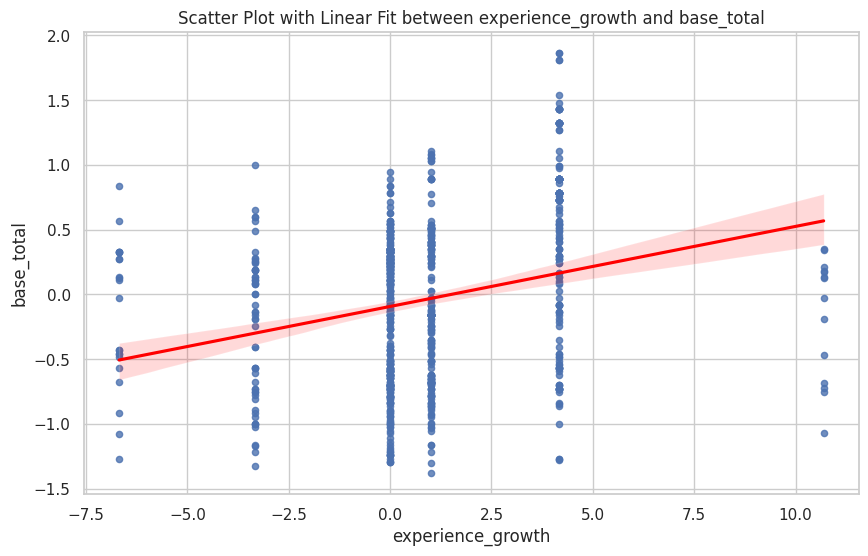

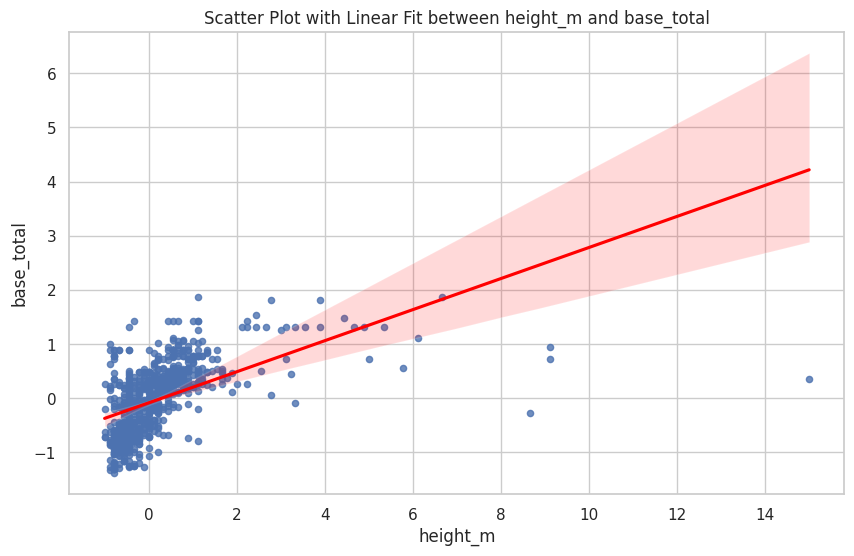

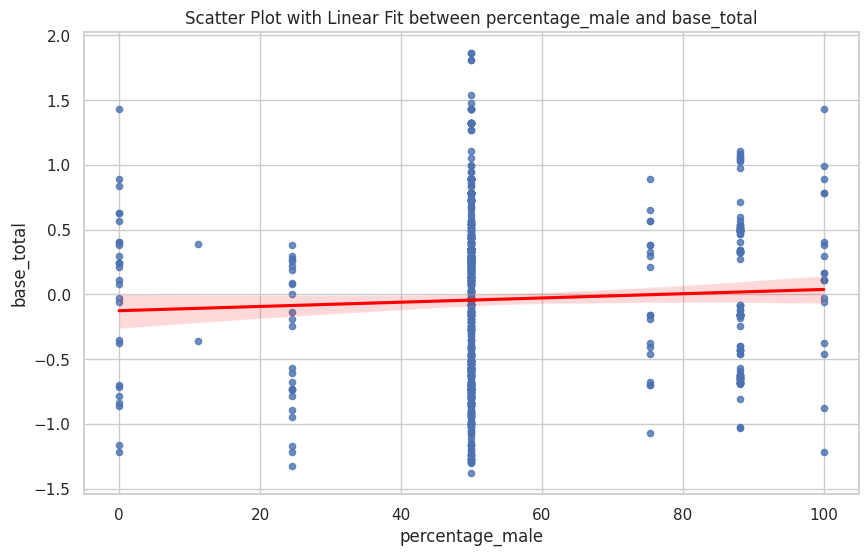

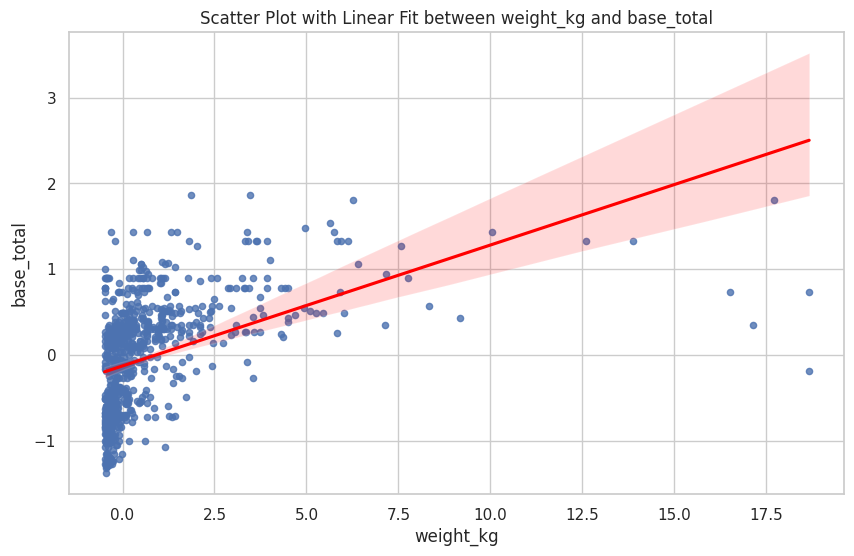

In [70]:
#Compare all the features of  the dataset with base_total using scatter plot with best fit line

features = [
    'sp_attack', 'sp_defense', 'speed', 'hp', 'attack', 'defense',
    'base_happiness', 'base_egg_steps', 'capture_rate',
    'experience_growth', 'height_m', 'percentage_male', 'weight_kg',
]

# Plotting each feature against base_total
for feature in features:
    plt.figure(figsize=(10, 6))
    sns.regplot(x=feature, y='base_total', data=df, scatter_kws={'s': 20}, line_kws={"color":"red"})
    plt.title(f'Scatter Plot with Linear Fit between {feature} and base_total')
    plt.xlabel(feature)
    plt.ylabel('base_total')
    plt.show()


capture_rate is negatively correlated with attack,defense,speed,hp,sp_attack,sp_defense,height_m,weight_kg

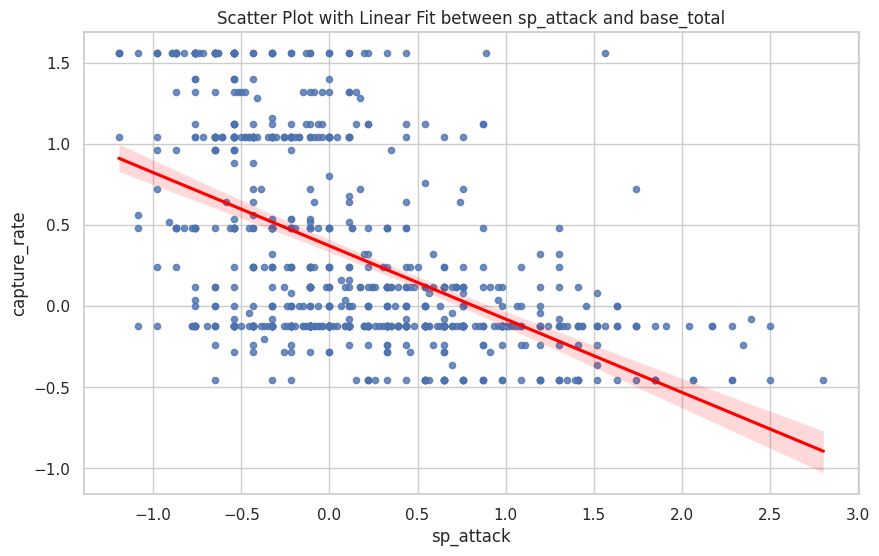

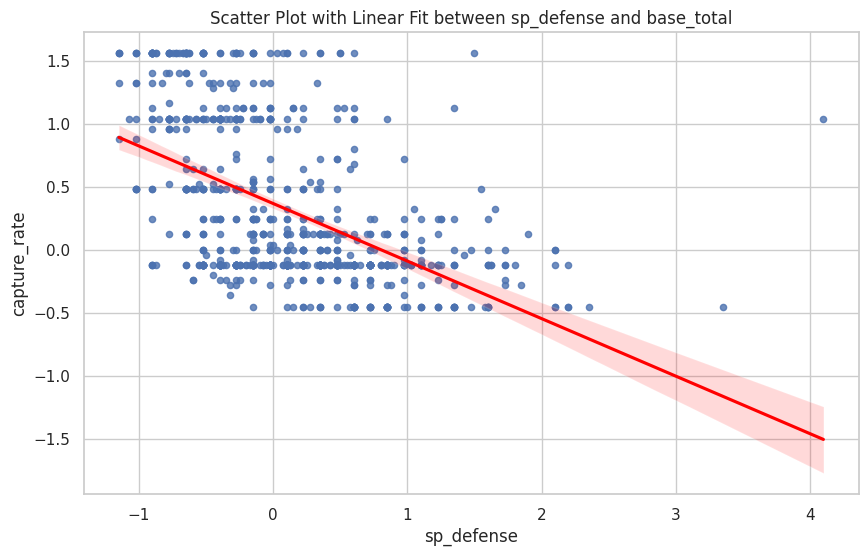

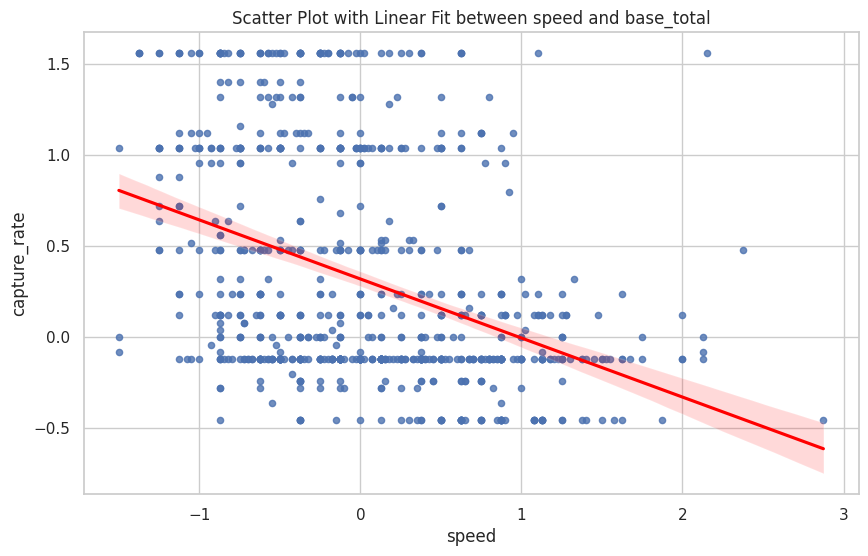

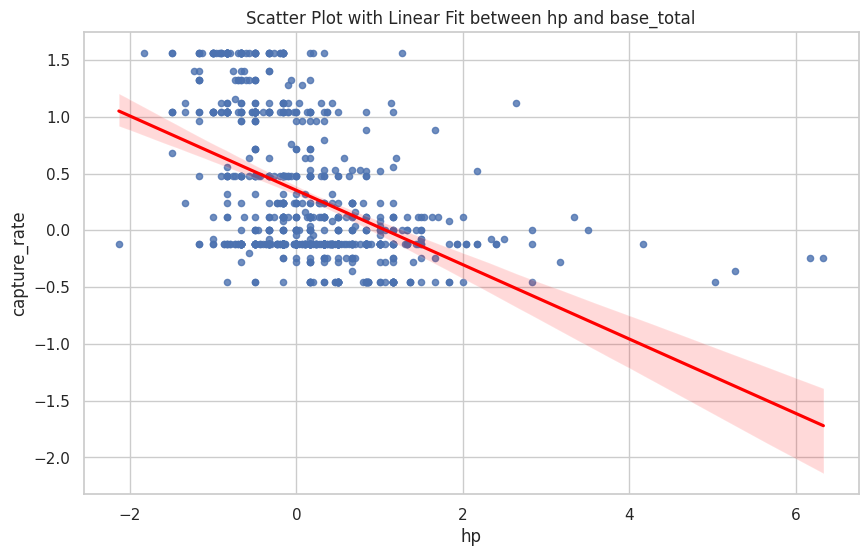

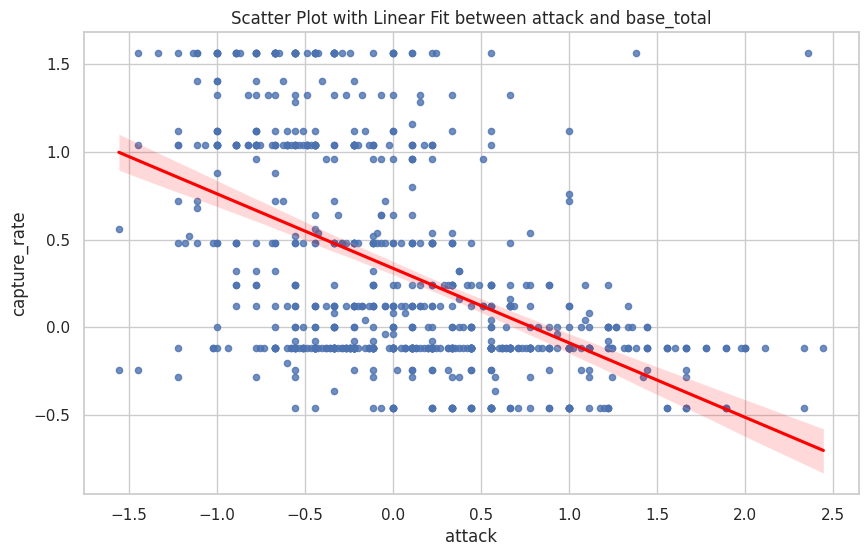

...

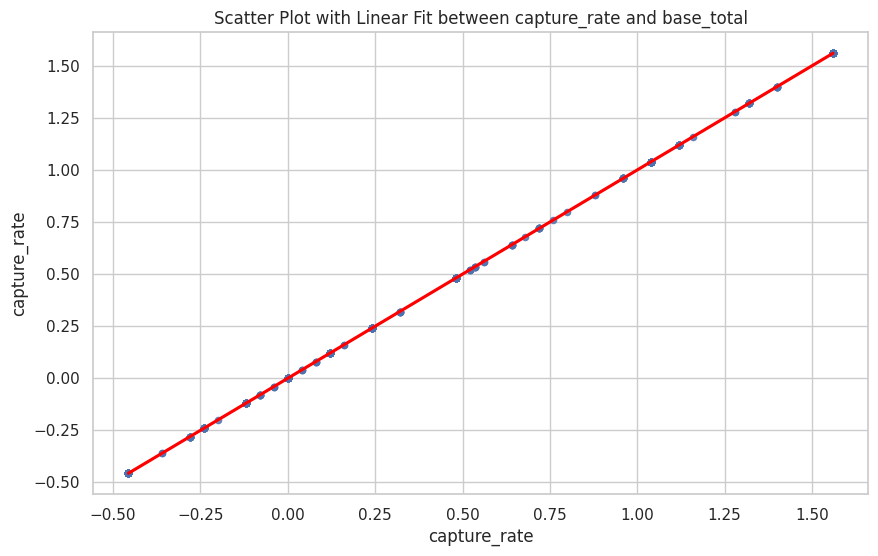

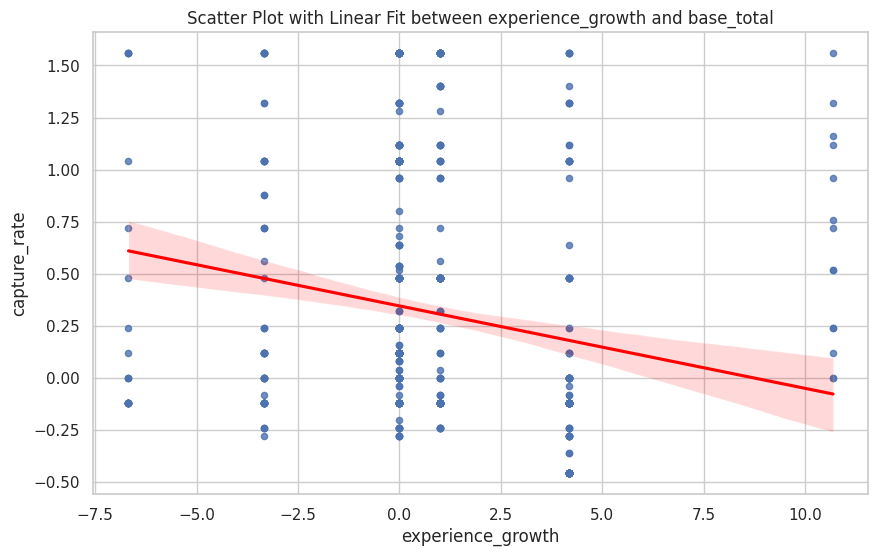

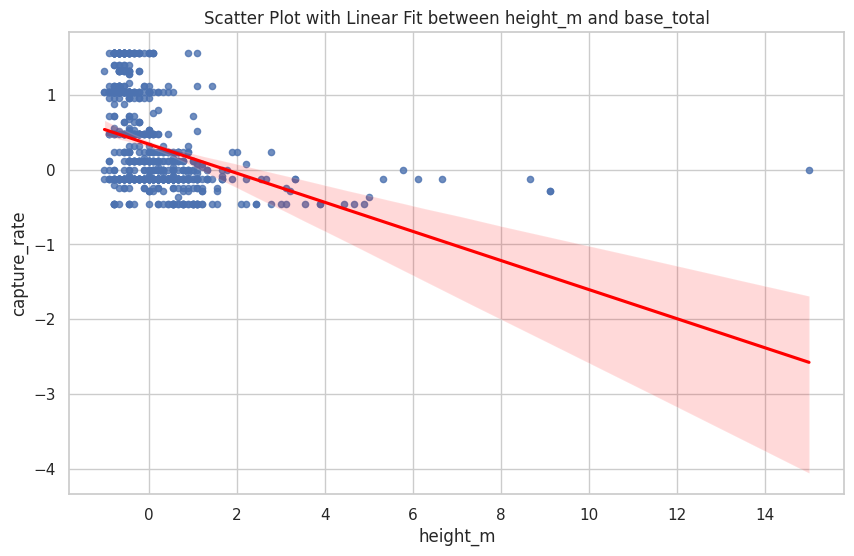

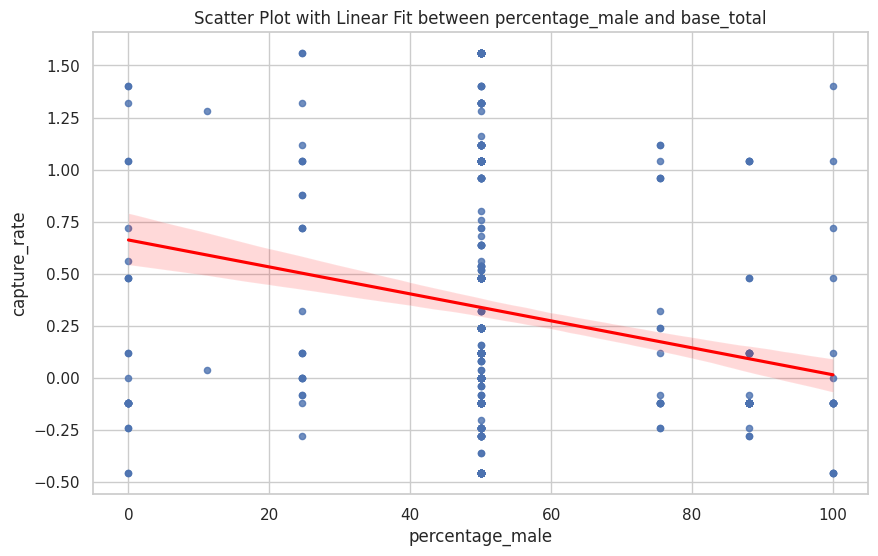

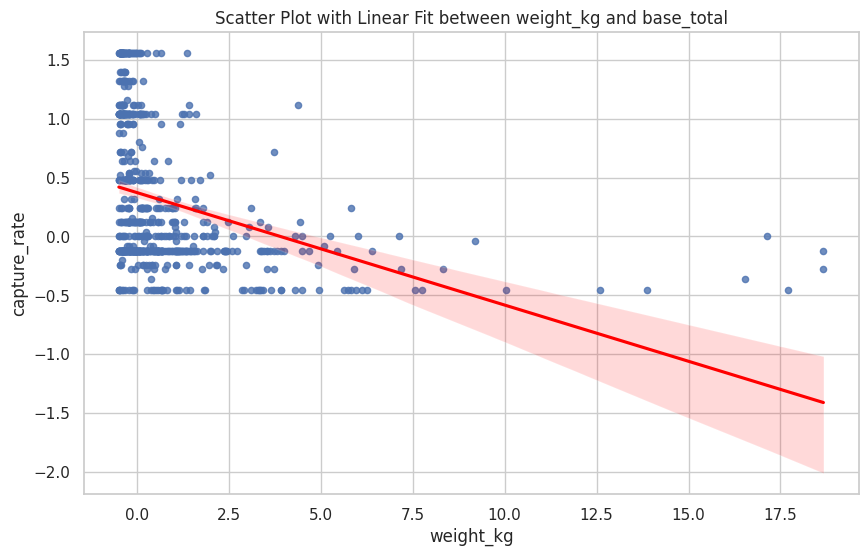

In [71]:
#Compare all the features of  the dataset with capture_rate using scatter plot with best fit line

features = [
    'sp_attack', 'sp_defense', 'speed', 'hp', 'attack', 'defense',
    'base_happiness', 'base_egg_steps', 'capture_rate',
    'experience_growth', 'height_m', 'percentage_male', 'weight_kg',
]

# Plotting each feature against base_total
for feature in features:
    plt.figure(figsize=(10, 6))
    sns.regplot(x=feature, y='capture_rate', data=df, scatter_kws={'s': 20}, line_kws={"color":"red"})
    plt.title(f'Scatter Plot with Linear Fit between {feature} and base_total')
    plt.xlabel(feature)
    plt.ylabel('capture_rate')
    plt.show()

**Special Finding**

From the above comparisions of both base_total and capture_rate we can arrive at a specific conclusion that both of them are negatively correlated without even comparing them directly . we can prove the same from the below graph

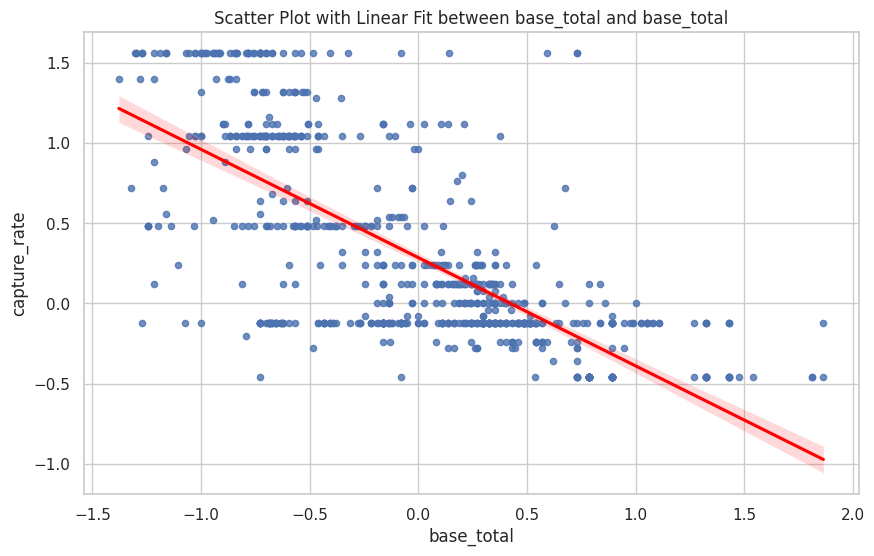

In [72]:
#Compare all the features of  the dataset with capture_rate using scatter plot with best fit line
import matplotlib.pyplot as plt
import seaborn as sns
features = ['base_total']

# Plotting each feature against base_total
for feature in features:
    plt.figure(figsize=(10, 6))
    sns.regplot(x=feature, y='capture_rate', data=df, scatter_kws={'s': 20}, line_kws={"color":"red"})
    plt.title(f'Scatter Plot with Linear Fit between {feature} and base_total')
    plt.xlabel(feature)
    plt.ylabel('capture_rate')
    plt.show()

In [73]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [74]:
df.to_csv('/content/drive/My Drive/pokemon.csv', index=False)

As we have discussed earlier the dataset is highly imbalanced and we need apply resampling techniques which we are going to discuss clearly  while creating our model

In [75]:
print(df['is_legendary'].value_counts())

is_legendary
0    731
1     70
Name: count, dtype: int64
